# Project: Wrangling and Analyze Data

## Data Gathering
In the cell below, gather **all** three pieces of data for this project and load them in the notebook. **Note:** the methods required to gather each data are different.


In [1]:
# Import our libraries
import pandas as pd
import numpy as npy
import matplotlib.pyplot as plt
import requests
import tweepy
import numpy as np
import os
%matplotlib inline

In [2]:
# For better assessment set notebook to not collapse rows and columns of dataframe set pandasDataFrame not to collapse rows and columns when displaying them
pd.set_option('display.max_rows', None, 'display.max_columns', None)

In [3]:
# Error:
# SettingWithCopyWarning: A value is trying to be set on a copy of a
# slice from a DataFrame

# As explained in the Source, this warning is usually safe to ignore. You
# can disable it by running the following:
pd.options.mode.chained_assignment = None  # default='warn'

1. Directly download the WeRateDogs Twitter archive data (twitter_archive_enhanced.csv)

In [4]:
#read the 'twitter-archive-enhanced.csv' into pandas DataFrame
df_dogs = pd.read_csv('twitter-archive-enhanced.csv')

2. Use the Requests library to download the tweet image prediction (image_predictions.tsv)

In [5]:
#download image-predictions.tsv programmatically
if not os.path.exists('image-predictions.tsv'):
    url = "https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv"
    response = requests.get(url)
    with open(os.path.join(url.split('/')[-1]), mode = 'wb') as file:
        file.write(response.content)

In [6]:
#read image-predictions.tsv into a pandasDataFrame
df_images = pd.read_csv("image-predictions.tsv", sep='\t')

3. Use the Tweepy library to query additional data via the Twitter API (tweet_json.txt)

In [7]:
# Having failed to obtain a twitter development account to enable me get access and the necessary permissions to use the twitter
#api, i have resorted to using the data from the tweet_json file provided for us in the classroom
#read the 'tweet-json.txt' into a pandasDataFrame
tweet_df = pd.read_json('tweet-json.txt', lines=True)

In [8]:
# Make copies of all the dataSets
we_rate_dogs = df_dogs.copy()
image_predictions = df_images.copy()
tweet_json = tweet_df.copy()

## Assessing Data
In this section, detect and document at least **eight (8) quality issues and two (2) tidiness issue**. You must use **both** visual assessment
programmatic assessement to assess the data.

In [9]:
we_rate_dogs.head(5)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None


In [10]:
image_predictions.head(5)

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True


In [11]:
tweet_json.head(5)

,created_at,id,id_str,full_text,truncated,display_text_range,entities,extended_entities,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,in_reply_to_screen_name,user,geo,coordinates,place,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,possibly_sensitive_appealable,lang,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status
0,2017-08-01 16:23:56+00:00,892420643555336193,892420643555336192,This is Phineas. He's a mystical boy. Only eve...,False,"[0, 85]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 892420639486877696, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,8853,39467,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
1,2017-08-01 00:17:27+00:00,892177421306343426,892177421306343424,This is Tilly. She's just checking pup on you....,False,"[0, 138]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 892177413194625024, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,6514,33819,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
2,2017-07-31 00:18:03+00:00,891815181378084864,891815181378084864,This is Archie. He is a rare Norwegian Pouncin...,False,"[0, 121]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 891815175371796480, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,4328,25461,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
3,2017-07-30 15:58:51+00:00,891689557279858688,891689557279858688,This is Darla. She commenced a snooze mid meal...,False,"[0, 79]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 891689552724799489, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,8964,42908,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
4,2017-07-29 16:00:24+00:00,891327558926688256,891327558926688256,This is Franklin. He would like you to stop ca...,False,"[0, 138]","{'hashtags': [{'text': 'BarkWeek', 'indices': ...","{'media': [{'id': 891327551943041024, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,9774,41048,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN


In [12]:
we_rate_dogs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2356 non-null   int64  
 1   in_reply_to_status_id       78 non-null     float64
 2   in_reply_to_user_id         78 non-null     float64
 3   timestamp                   2356 non-null   object 
 4   source                      2356 non-null   object 
 5   text                        2356 non-null   object 
 6   retweeted_status_id         181 non-null    float64
 7   retweeted_status_user_id    181 non-null    float64
 8   retweeted_status_timestamp  181 non-null    object 
 9   expanded_urls               2297 non-null   object 
 10  rating_numerator            2356 non-null   int64  
 11  rating_denominator          2356 non-null   int64  
 12  name                        2356 non-null   object 
 13  doggo                       2356 

In [13]:
image_predictions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2075 non-null   int64  
 1   jpg_url   2075 non-null   object 
 2   img_num   2075 non-null   int64  
 3   p1        2075 non-null   object 
 4   p1_conf   2075 non-null   float64
 5   p1_dog    2075 non-null   bool   
 6   p2        2075 non-null   object 
 7   p2_conf   2075 non-null   float64
 8   p2_dog    2075 non-null   bool   
 9   p3        2075 non-null   object 
 10  p3_conf   2075 non-null   float64
 11  p3_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


In [14]:
tweet_json.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 31 columns):
 #   Column                         Non-Null Count  Dtype              
---  ------                         --------------  -----              
 0   created_at                     2354 non-null   datetime64[ns, UTC]
 1   id                             2354 non-null   int64              
 2   id_str                         2354 non-null   int64              
 3   full_text                      2354 non-null   object             
 4   truncated                      2354 non-null   bool               
 5   display_text_range             2354 non-null   object             
 6   entities                       2354 non-null   object             
 7   extended_entities              2073 non-null   object             
 8   source                         2354 non-null   object             
 9   in_reply_to_status_id          78 non-null     float64            
 10  in_reply_to_status_id_st

##### I wrote a code to loop through the entire dataset and present all the columns in a row with appropriate headings and sections. This would make it easier to see each and every entry. this may not be so great for large datasets both hey! you never know what you may find. I am going to use it on only one dataset to demonstrate how it works for the purpose of this report.


In [15]:
#access every column in we rate dogs so that we can see what they contain
for columns in we_rate_dogs:
    i = 1
    for items in we_rate_dogs[columns]:
        print(i, ": " , items)
        i += 1
    print('end of'+ columns +'\n')

1 :  892420643555336193
2 :  892177421306343426
3 :  891815181378084864
4 :  891689557279858688
5 :  891327558926688256
6 :  891087950875897856
7 :  890971913173991426
8 :  890729181411237888
9 :  890609185150312448
10 :  890240255349198849
11 :  890006608113172480
12 :  889880896479866881
13 :  889665388333682689
14 :  889638837579907072
15 :  889531135344209921
16 :  889278841981685760
17 :  888917238123831296
18 :  888804989199671297
19 :  888554962724278272
20 :  888202515573088257
21 :  888078434458587136
22 :  887705289381826560
23 :  887517139158093824
24 :  887473957103951883
25 :  887343217045368832
26 :  887101392804085760
27 :  886983233522544640
28 :  886736880519319552
29 :  886680336477933568
30 :  886366144734445568
31 :  886267009285017600
32 :  886258384151887873
33 :  886054160059072513
34 :  885984800019947520
35 :  885528943205470208
36 :  885518971528720385
37 :  885311592912609280
38 :  885167619883638784
39 :  884925521741709313
40 :  884876753390489601
41 :  884

539 :  806620845233815552
540 :  806576416489959424
541 :  806542213899489280
542 :  806242860592926720
543 :  806219024703037440
544 :  805958939288408065
545 :  805932879469572096
546 :  805826884734976000
547 :  805823200554876929
548 :  805520635690676224
549 :  805487436403003392
550 :  805207613751304193
551 :  804738756058218496
552 :  804475857670639616
553 :  804413760345620481
554 :  804026241225523202
555 :  803773340896923648
556 :  803692223237865472
557 :  803638050916102144
558 :  803380650405482500
559 :  803321560782307329
560 :  803276597545603072
561 :  802952499103731712
562 :  802624713319034886
563 :  802600418706604034
564 :  802572683846291456
565 :  802323869084381190
566 :  802265048156610565
567 :  802247111496568832
568 :  802239329049477120
569 :  802185808107208704
570 :  801958328846974976
571 :  801854953262350336
572 :  801538201127157760
573 :  801285448605831168
574 :  801167903437357056
575 :  801127390143516673
576 :  801115127852503040
577 :  80085

1206 :  715928423106027520
1207 :  715758151270801409
1208 :  715733265223708672
1209 :  715704790270025728
1210 :  715696743237730304
1211 :  715680795826982913
1212 :  715360349751484417
1213 :  715342466308784130
1214 :  715220193576927233
1215 :  715200624753819648
1216 :  715009755312439296
1217 :  714982300363173890
1218 :  714962719905021952
1219 :  714957620017307648
1220 :  714631576617938945
1221 :  714606013974974464
1222 :  714485234495041536
1223 :  714258258790387713
1224 :  714251586676113411
1225 :  714214115368108032
1226 :  714141408463036416
1227 :  713919462244790272
1228 :  713909862279876608
1229 :  713900603437621249
1230 :  713761197720473600
1231 :  713411074226274305
1232 :  713177543487135744
1233 :  713175907180089344
1234 :  712809025985978368
1235 :  712717840512598017
1236 :  712668654853337088
1237 :  712438159032893441
1238 :  712309440758808576
1239 :  712097430750289920
1240 :  712092745624633345
1241 :  712085617388212225
1242 :  712065007010385924
1

1636 :  684222868335505415
1637 :  684200372118904832
1638 :  684195085588783105
1639 :  684188786104872960
1640 :  684177701129875456
1641 :  684147889187209216
1642 :  684122891630342144
1643 :  684097758874210310
1644 :  683857920510050305
1645 :  683852578183077888
1646 :  683849932751646720
1647 :  683834909291606017
1648 :  683828599284170753
1649 :  683773439333797890
1650 :  683742671509258241
1651 :  683515932363329536
1652 :  683498322573824003
1653 :  683481228088049664
1654 :  683462770029932544
1655 :  683449695444799489
1656 :  683391852557561860
1657 :  683357973142474752
1658 :  683142553609318400
1659 :  683111407806746624
1660 :  683098815881154561
1661 :  683078886620553216
1662 :  683030066213818368
1663 :  682962037429899265
1664 :  682808988178739200
1665 :  682788441537560576
1666 :  682750546109968385
1667 :  682697186228989953
1668 :  682662431982772225
1669 :  682638830361513985
1670 :  682429480204398592
1671 :  682406705142087680
1672 :  682393905736888321
1

2169 :  669354382627049472
2170 :  669353438988365824
2171 :  669351434509529089
2172 :  669328503091937280
2173 :  669327207240699904
2174 :  669324657376567296
2175 :  669216679721873412
2176 :  669214165781868544
2177 :  669203728096960512
2178 :  669037058363662336
2179 :  669015743032369152
2180 :  669006782128353280
2181 :  669000397445533696
2182 :  668994913074286592
2183 :  668992363537309700
2184 :  668989615043424256
2185 :  668988183816871936
2186 :  668986018524233728
2187 :  668981893510119424
2188 :  668979806671884288
2189 :  668975677807423489
2190 :  668967877119254528
2191 :  668960084974809088
2192 :  668955713004314625
2193 :  668932921458302977
2194 :  668902994700836864
2195 :  668892474547511297
2196 :  668872652652679168
2197 :  668852170888998912
2198 :  668826086256599040
2199 :  668815180734689280
2200 :  668779399630725120
2201 :  668655139528511488
2202 :  668645506898350081
2203 :  668643542311546881
2204 :  668641109086707712
2205 :  668636665813057536
2

458 :  nan
459 :  nan
460 :  nan
461 :  nan
462 :  nan
463 :  nan
464 :  nan
465 :  nan
466 :  nan
467 :  nan
468 :  nan
469 :  nan
470 :  nan
471 :  nan
472 :  nan
473 :  nan
474 :  nan
475 :  nan
476 :  nan
477 :  nan
478 :  nan
479 :  nan
480 :  nan
481 :  nan
482 :  nan
483 :  nan
484 :  nan
485 :  nan
486 :  nan
487 :  nan
488 :  nan
489 :  nan
490 :  nan
491 :  nan
492 :  nan
493 :  nan
494 :  nan
495 :  nan
496 :  nan
497 :  nan
498 :  nan
499 :  8.13127251579564e+17
500 :  nan
501 :  nan
502 :  nan
503 :  nan
504 :  nan
505 :  nan
506 :  nan
507 :  nan
508 :  nan
509 :  nan
510 :  nan
511 :  nan
512 :  nan
513 :  nan
514 :  8.116272330434806e+17
515 :  nan
516 :  nan
517 :  nan
518 :  nan
519 :  nan
520 :  nan
521 :  nan
522 :  nan
523 :  nan
524 :  nan
525 :  nan
526 :  nan
527 :  nan
528 :  nan
529 :  nan
530 :  nan
531 :  nan
532 :  nan
533 :  nan
534 :  nan
535 :  nan
536 :  nan
537 :  nan
538 :  nan
539 :  nan
540 :  nan
541 :  nan
542 :  nan
543 :  nan
544 :  nan
545 :  n

1476 :  nan
1477 :  nan
1478 :  nan
1479 :  nan
1480 :  6.935722159383675e+17
1481 :  nan
1482 :  nan
1483 :  nan
1484 :  nan
1485 :  nan
1486 :  nan
1487 :  nan
1488 :  nan
1489 :  nan
1490 :  nan
1491 :  nan
1492 :  nan
1493 :  nan
1494 :  nan
1495 :  nan
1496 :  nan
1497 :  nan
1498 :  6.924173130233324e+17
1499 :  nan
1500 :  nan
1501 :  nan
1502 :  6.920419346894029e+17
1503 :  nan
1504 :  nan
1505 :  nan
1506 :  nan
1507 :  nan
1508 :  nan
1509 :  nan
1510 :  nan
1511 :  nan
1512 :  nan
1513 :  nan
1514 :  nan
1515 :  nan
1516 :  nan
1517 :  nan
1518 :  nan
1519 :  nan
1520 :  nan
1521 :  nan
1522 :  nan
1523 :  nan
1524 :  6.903412535490028e+17
1525 :  nan
1526 :  nan
1527 :  nan
1528 :  nan
1529 :  nan
1530 :  nan
1531 :  nan
1532 :  nan
1533 :  nan
1534 :  nan
1535 :  nan
1536 :  nan
1537 :  nan
1538 :  nan
1539 :  nan
1540 :  nan
1541 :  nan
1542 :  nan
1543 :  nan
1544 :  nan
1545 :  nan
1546 :  nan
1547 :  nan
1548 :  nan
1549 :  nan
1550 :  nan
1551 :  nan
1552 :  nan
1553

2182 :  nan
2183 :  nan
2184 :  nan
2185 :  nan
2186 :  nan
2187 :  nan
2188 :  nan
2189 :  nan
2190 :  6.689207171325829e+17
2191 :  nan
2192 :  nan
2193 :  nan
2194 :  nan
2195 :  nan
2196 :  nan
2197 :  nan
2198 :  nan
2199 :  nan
2200 :  nan
2201 :  nan
2202 :  nan
2203 :  nan
2204 :  nan
2205 :  nan
2206 :  nan
2207 :  nan
2208 :  nan
2209 :  nan
2210 :  nan
2211 :  nan
2212 :  nan
2213 :  nan
2214 :  nan
2215 :  nan
2216 :  nan
2217 :  nan
2218 :  nan
2219 :  nan
2220 :  nan
2221 :  nan
2222 :  nan
2223 :  nan
2224 :  nan
2225 :  nan
2226 :  nan
2227 :  nan
2228 :  nan
2229 :  nan
2230 :  nan
2231 :  nan
2232 :  nan
2233 :  nan
2234 :  nan
2235 :  nan
2236 :  nan
2237 :  nan
2238 :  nan
2239 :  nan
2240 :  nan
2241 :  nan
2242 :  nan
2243 :  nan
2244 :  nan
2245 :  nan
2246 :  nan
2247 :  nan
2248 :  nan
2249 :  nan
2250 :  nan
2251 :  nan
2252 :  nan
2253 :  nan
2254 :  nan
2255 :  nan
2256 :  nan
2257 :  nan
2258 :  nan
2259 :  nan
2260 :  nan
2261 :  nan
2262 :  nan
2263 :  na

853 :  nan
854 :  nan
855 :  nan
856 :  nan
857 :  nan
858 :  15846407.0
859 :  nan
860 :  nan
861 :  nan
862 :  nan
863 :  nan
864 :  nan
865 :  nan
866 :  nan
867 :  nan
868 :  nan
869 :  nan
870 :  nan
871 :  nan
872 :  nan
873 :  nan
874 :  nan
875 :  nan
876 :  nan
877 :  nan
878 :  nan
879 :  nan
880 :  nan
881 :  nan
882 :  nan
883 :  nan
884 :  nan
885 :  nan
886 :  nan
887 :  nan
888 :  nan
889 :  nan
890 :  nan
891 :  nan
892 :  nan
893 :  nan
894 :  nan
895 :  nan
896 :  nan
897 :  nan
898 :  nan
899 :  nan
900 :  nan
901 :  nan
902 :  nan
903 :  nan
904 :  nan
905 :  nan
906 :  nan
907 :  nan
908 :  nan
909 :  nan
910 :  nan
911 :  nan
912 :  nan
913 :  nan
914 :  nan
915 :  nan
916 :  nan
917 :  nan
918 :  nan
919 :  nan
920 :  nan
921 :  nan
922 :  nan
923 :  nan
924 :  nan
925 :  nan
926 :  nan
927 :  nan
928 :  nan
929 :  nan
930 :  nan
931 :  nan
932 :  nan
933 :  nan
934 :  nan
935 :  nan
936 :  nan
937 :  nan
938 :  nan
939 :  nan
940 :  nan
941 :  nan
942 :  nan
943

1881 :  nan
1882 :  nan
1883 :  4196983835.0
1884 :  nan
1885 :  nan
1886 :  4196983835.0
1887 :  nan
1888 :  nan
1889 :  nan
1890 :  nan
1891 :  nan
1892 :  nan
1893 :  4196983835.0
1894 :  nan
1895 :  nan
1896 :  4196983835.0
1897 :  nan
1898 :  nan
1899 :  nan
1900 :  nan
1901 :  nan
1902 :  nan
1903 :  nan
1904 :  nan
1905 :  nan
1906 :  4196983835.0
1907 :  nan
1908 :  nan
1909 :  nan
1910 :  nan
1911 :  nan
1912 :  nan
1913 :  nan
1914 :  nan
1915 :  16374678.0
1916 :  nan
1917 :  nan
1918 :  nan
1919 :  nan
1920 :  nan
1921 :  nan
1922 :  nan
1923 :  nan
1924 :  nan
1925 :  nan
1926 :  nan
1927 :  nan
1928 :  nan
1929 :  nan
1930 :  nan
1931 :  nan
1932 :  nan
1933 :  nan
1934 :  nan
1935 :  nan
1936 :  nan
1937 :  nan
1938 :  nan
1939 :  nan
1940 :  nan
1941 :  4196983835.0
1942 :  nan
1943 :  nan
1944 :  nan
1945 :  nan
1946 :  nan
1947 :  nan
1948 :  nan
1949 :  nan
1950 :  nan
1951 :  nan
1952 :  nan
1953 :  nan
1954 :  nan
1955 :  nan
1956 :  nan
1957 :  nan
1958 :  nan
195

120 :  2017-05-31 04:27:59 +0000
121 :  2017-05-30 23:51:58 +0000
122 :  2017-05-30 16:49:31 +0000
123 :  2017-05-29 16:24:37 +0000
124 :  2017-05-28 17:23:24 +0000
125 :  2017-05-28 01:26:04 +0000
126 :  2017-05-28 00:18:35 +0000
127 :  2017-05-27 19:39:34 +0000
128 :  2017-05-26 00:29:37 +0000
129 :  2017-05-25 16:10:44 +0000
130 :  2017-05-24 16:44:18 +0000
131 :  2017-05-23 17:40:04 +0000
132 :  2017-05-23 16:16:06 +0000
133 :  2017-05-23 00:41:20 +0000
134 :  2017-05-22 18:21:28 +0000
135 :  2017-05-22 16:06:55 +0000
136 :  2017-05-22 00:28:40 +0000
137 :  2017-05-21 16:48:45 +0000
138 :  2017-05-21 00:53:21 +0000
139 :  2017-05-19 23:57:46 +0000
140 :  2017-05-19 00:12:11 +0000
141 :  2017-05-18 00:50:50 +0000
142 :  2017-05-17 16:00:15 +0000
143 :  2017-05-16 00:41:21 +0000
144 :  2017-05-15 19:14:50 +0000
145 :  2017-05-15 00:02:33 +0000
146 :  2017-05-14 00:34:33 +0000
147 :  2017-05-13 19:11:30 +0000
148 :  2017-05-13 16:33:49 +0000
149 :  2017-05-13 16:15:35 +0000
150 :  201

635 :  2016-11-02 00:42:53 +0000
636 :  2016-11-01 23:53:02 +0000
637 :  2016-11-01 17:12:16 +0000
638 :  2016-11-01 03:00:09 +0000
639 :  2016-11-01 02:00:14 +0000
640 :  2016-11-01 01:00:05 +0000
641 :  2016-11-01 00:00:38 +0000
642 :  2016-10-31 23:00:11 +0000
643 :  2016-10-31 22:00:04 +0000
644 :  2016-10-31 21:00:23 +0000
645 :  2016-10-31 20:00:05 +0000
646 :  2016-10-31 19:00:10 +0000
647 :  2016-10-31 18:00:14 +0000
648 :  2016-10-31 17:00:11 +0000
649 :  2016-10-31 16:00:13 +0000
650 :  2016-10-31 02:17:31 +0000
651 :  2016-10-31 00:20:11 +0000
652 :  2016-10-30 17:02:53 +0000
653 :  2016-10-29 15:55:58 +0000
654 :  2016-10-28 17:07:05 +0000
655 :  2016-10-28 01:58:16 +0000
656 :  2016-10-27 23:30:09 +0000
657 :  2016-10-27 23:17:38 +0000
658 :  2016-10-27 22:53:48 +0000
659 :  2016-10-27 16:06:04 +0000
660 :  2016-10-26 22:31:36 +0000
661 :  2016-10-26 16:14:55 +0000
662 :  2016-10-25 21:18:40 +0000
663 :  2016-10-25 18:44:32 +0000
664 :  2016-10-25 16:00:09 +0000
665 :  201

1191 :  2016-04-08 00:30:51 +0000
1192 :  2016-04-06 22:29:56 +0000
1193 :  2016-04-06 19:04:14 +0000
1194 :  2016-04-06 02:21:30 +0000
1195 :  2016-04-05 19:09:17 +0000
1196 :  2016-04-05 18:41:02 +0000
1197 :  2016-04-04 17:53:31 +0000
1198 :  2016-04-04 15:22:08 +0000
1199 :  2016-04-04 01:41:58 +0000
1200 :  2016-04-04 00:55:01 +0000
1201 :  2016-04-03 20:53:33 +0000
1202 :  2016-04-03 02:08:05 +0000
1203 :  2016-04-03 01:36:11 +0000
1204 :  2016-04-02 15:25:47 +0000
1205 :  2016-04-02 01:52:38 +0000
1206 :  2016-04-01 15:46:52 +0000
1207 :  2016-04-01 04:30:16 +0000
1208 :  2016-04-01 02:51:22 +0000
1209 :  2016-04-01 00:58:13 +0000
1210 :  2016-04-01 00:26:15 +0000
1211 :  2016-03-31 23:22:53 +0000
1212 :  2016-03-31 02:09:32 +0000
1213 :  2016-03-31 00:58:29 +0000
1214 :  2016-03-30 16:52:36 +0000
1215 :  2016-03-30 15:34:51 +0000
1216 :  2016-03-30 02:56:24 +0000
1217 :  2016-03-30 01:07:18 +0000
1218 :  2016-03-29 23:49:30 +0000
1219 :  2016-03-29 23:29:14 +0000
1220 :  2016-0

1801 :  2015-12-16 04:01:59 +0000
1802 :  2015-12-16 02:51:45 +0000
1803 :  2015-12-16 02:19:04 +0000
1804 :  2015-12-16 02:13:31 +0000
1805 :  2015-12-16 02:08:04 +0000
1806 :  2015-12-16 01:50:26 +0000
1807 :  2015-12-16 01:27:03 +0000
1808 :  2015-12-16 00:09:23 +0000
1809 :  2015-12-15 22:52:02 +0000
1810 :  2015-12-15 20:40:47 +0000
1811 :  2015-12-15 17:51:44 +0000
1812 :  2015-12-15 17:42:34 +0000
1813 :  2015-12-15 17:11:09 +0000
1814 :  2015-12-15 14:50:49 +0000
1815 :  2015-12-15 04:19:18 +0000
1816 :  2015-12-15 04:05:01 +0000
1817 :  2015-12-15 03:36:42 +0000
1818 :  2015-12-15 03:23:14 +0000
1819 :  2015-12-15 02:43:33 +0000
1820 :  2015-12-15 02:32:17 +0000
1821 :  2015-12-15 02:23:26 +0000
1822 :  2015-12-15 02:02:01 +0000
1823 :  2015-12-15 01:32:24 +0000
1824 :  2015-12-14 22:46:41 +0000
1825 :  2015-12-14 20:17:59 +0000
1826 :  2015-12-14 18:35:43 +0000
1827 :  2015-12-14 16:34:00 +0000
1828 :  2015-12-14 15:57:56 +0000
1829 :  2015-12-14 04:52:55 +0000
1830 :  2015-1

2301 :  2015-11-18 19:29:52 +0000
2302 :  2015-11-18 18:17:59 +0000
2303 :  2015-11-18 16:12:51 +0000
2304 :  2015-11-18 15:07:24 +0000
2305 :  2015-11-18 14:18:59 +0000
2306 :  2015-11-18 04:35:11 +0000
2307 :  2015-11-18 04:27:09 +0000
2308 :  2015-11-18 03:54:28 +0000
2309 :  2015-11-18 03:18:55 +0000
2310 :  2015-11-18 02:25:23 +0000
2311 :  2015-11-18 01:12:41 +0000
2312 :  2015-11-18 00:55:42 +0000
2313 :  2015-11-18 00:36:17 +0000
2314 :  2015-11-17 22:06:57 +0000
2315 :  2015-11-17 19:35:19 +0000
2316 :  2015-11-17 18:56:35 +0000
2317 :  2015-11-17 16:09:56 +0000
2318 :  2015-11-17 15:51:26 +0000
2319 :  2015-11-17 03:16:00 +0000
2320 :  2015-11-17 02:46:43 +0000
2321 :  2015-11-17 02:06:42 +0000
2322 :  2015-11-17 02:00:15 +0000
2323 :  2015-11-17 01:40:41 +0000
2324 :  2015-11-17 01:30:57 +0000
2325 :  2015-11-17 01:02:40 +0000
2326 :  2015-11-17 00:53:15 +0000
2327 :  2015-11-17 00:24:19 +0000
2328 :  2015-11-17 00:06:54 +0000
2329 :  2015-11-16 23:23:41 +0000
2330 :  2015-1

445 :  <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>
446 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
447 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
448 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
449 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
450 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
451 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
452 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
453 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
454 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
455 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
456 :  <a href="http://twi

1023 :  <a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>
1024 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
1025 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
1026 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
1027 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
1028 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
1029 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
1030 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
1031 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
1032 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
1033 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
1034 :  <a href="h

1522 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
1523 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
1524 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
1525 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
1526 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
1527 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
1528 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
1529 :  <a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>
1530 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
1531 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
1532 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
1533 :  <a href="h

2053 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
2054 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
2055 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
2056 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
2057 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
2058 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
2059 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
2060 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
2061 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
2062 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>
2063 :  <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>

254 :  This is Luna. It's her first time outside and a bee stung her nose. Completely h*ckin uncalled for. 13/10 where's the bee I just wanna talk https://t.co/2RYiLGHuPN
255 :  This is Charlie. He wants to know if you have a moment to talk about washing machine insurance policies. 11/10 would hear him out https://t.co/gAzPqT7uyk
256 :  This is Margo. She just dug pup a massive hole. Can't wait for you to see it. H*ckin proud of herself. 12/10 would forgive then pet https://t.co/H38HB6rBTx
257 :  HE WAS DOING A SNOOZE NO SHAME IN A SNOOZE 13/10 https://t.co/Gu5wHx3CBd
258 :  Say hello to Sadie and Daisy. They do all their shopping together. Can never agree on what to get. Like an old married pupple. Both 12/10 https://t.co/f5C5l5wa0e
259 :  This is Hank. He's been outside for 3 minutes and already made a friend. Way to go Hank. 11/10 for both https://t.co/wHUElL84RC
260 :  This is Tycho. She just had new wheels installed. About to do a zoom. 0-60 in 2.4 seconds. 13/10 inspirational as 

754 :  RT @dog_rates: In case you haven't seen the most dramatic sneeze ever... 13/10 https://t.co/iy7ylyZcsE
755 :  Oh my god it's Narcos but Barkos. 13/10 someone please make this happen
https://t.co/tird9cIlzB
756 :  This is Mya (pronounced "mmmyah?"). Her head is round af. 11/10 would pat accordingly https://t.co/1dpEuALnY0
757 :  Meet Strider. He thinks he's a sorority girl. Already wants to go to NYC for a weekend to say he's "studied abroad" 10/10 https://t.co/KYZkPuiC1l
758 :  This is Penny. She's a sailor pup. 11/10 would take to the open seas with https://t.co/0rRxyBQt32
759 :  RIP Loki. Thank you for the good times. You will be missed by many. 14/10 https://t.co/gJKD9pst5A
760 :  RT @dog_rates: This is an East African Chalupa Seal. We only rate dogs. Please only send in dogs. Thank you... 10/10 https://t.co/iHe6liLwWR
761 :  This is Nala. She's a future Dogue model. Won't respond to my texts. 13/10 would be an honor to pet https://t.co/zP1IvAATWv
762 :  This is Stanley. He h

1330 :  Meet Max. He's a Fallopian Cephalopuff. Eyes are magical af. Lil dandruff problem. No big deal 10/10 would still pet https://t.co/c67nUjwmFs
1331 :  Seriously, add us 🐶 11/10 for sad wet pupper https://t.co/xwPE9faVZR
1332 :  "Ma'am, for the last time, I'm not authorized to make that type of transaction" 11/10 https://t.co/nPTBsdm3BF
1333 :  Say hello to Zara. She found a sandal and couldn't be happier. 12/10 great work https://t.co/zQUuVu812n
1334 :  This is Cooper. He only wakes up to switch gears. 12/10 helpful af https://t.co/EEIkAGVY64
1335 :  This is Ambrose. He's an Alfalfa Ballyhoo. Draws pistol fast af. Pretty much runs the frontier. 11/10 lethal pupper https://t.co/ih6epBOxIA
1336 :  This is Jimothy. He lost his body during the the Third Crusade (tragic). 11/10 heroic af tho https://t.co/wnsblfu7XE
1337 :  This is Bode. He's a heavy sleeper. 9/10 https://t.co/YMkxhGWUqv
1338 :  This is Terrenth. He just stubbed his toe. 10/10 deep breaths Terrenth https://t.co/Pg18CDF

1893 :  Just received another perfect photo of dogs and the sunset. 12/10 https://t.co/9YmNcxA2Cc
1894 :  Everyone please just appreciate how perfect these two photos are. 12/10 for both https://t.co/rLf7asnHxO
1895 :  This is Sophie. She just saw a spider. 10/10 don't just stand there Sophie https://t.co/VagYftZccT
1896 :  Some clarification is required. The dog is singing Cher and that is more than worthy of an 11/10. Thank you
1897 :  "🎶 DO YOU BELIEVE IN LIFE AFTER LOVE 🎶"
11/10 https://t.co/URNs5zFskc
1898 :  Meet Rufio. He is unaware of the pink legless pupper wrapped around him. Might want to get that checked 10/10 &amp; 4/10 https://t.co/KNfLnYPmYh
1899 :  Meet Patrick. He's an exotic pup. Jumps great distances for a dog. Always gets injured when I toss him a ball. 3/10 https://t.co/Unz1uNrOzo
1900 :  Meet Jeb &amp; Bush. Jeb is somehow stuck in that fence and Bush won't stop whispering sweet nothings in his ear. 9/10s https://t.co/NRNExUy9Hm
1901 :  This is Rodman. He's gettin

113 :  nan
114 :  nan
115 :  nan
116 :  nan
117 :  nan
118 :  nan
119 :  8.591969789027738e+17
120 :  nan
121 :  nan
122 :  nan
123 :  nan
124 :  nan
125 :  8.685522785248379e+17
126 :  nan
127 :  nan
128 :  nan
129 :  nan
130 :  nan
131 :  8.650134204453683e+17
132 :  nan
133 :  8.664507055314575e+17
134 :  nan
135 :  nan
136 :  nan
137 :  nan
138 :  8.378201676945285e+17
139 :  nan
140 :  nan
141 :  nan
142 :  nan
143 :  nan
144 :  nan
145 :  nan
146 :  nan
147 :  8.630624715311677e+17
148 :  nan
149 :  nan
150 :  nan
151 :  nan
152 :  nan
153 :  nan
154 :  nan
155 :  nan
156 :  8.06629075125203e+17
157 :  nan
158 :  nan
159 :  nan
160 :  8.605637731402097e+17
161 :  8.609144852504699e+17
162 :  nan
163 :  nan
164 :  nan
165 :  nan
166 :  7.616729943768064e+17
167 :  nan
168 :  nan
169 :  nan
170 :  nan
171 :  nan
172 :  8.395493263596708e+17
173 :  nan
174 :  nan
175 :  nan
176 :  nan
177 :  nan
178 :  nan
179 :  nan
180 :  nan
181 :  8.57061112319234e+17
182 :  nan
183 :  8.4470478

1210 :  nan
1211 :  nan
1212 :  nan
1213 :  nan
1214 :  nan
1215 :  nan
1216 :  nan
1217 :  nan
1218 :  nan
1219 :  nan
1220 :  nan
1221 :  nan
1222 :  nan
1223 :  nan
1224 :  nan
1225 :  nan
1226 :  nan
1227 :  nan
1228 :  nan
1229 :  nan
1230 :  nan
1231 :  nan
1232 :  nan
1233 :  nan
1234 :  nan
1235 :  nan
1236 :  nan
1237 :  nan
1238 :  nan
1239 :  nan
1240 :  nan
1241 :  nan
1242 :  nan
1243 :  7.119982797733478e+17
1244 :  nan
1245 :  nan
1246 :  nan
1247 :  nan
1248 :  nan
1249 :  nan
1250 :  nan
1251 :  nan
1252 :  nan
1253 :  nan
1254 :  nan
1255 :  nan
1256 :  nan
1257 :  nan
1258 :  nan
1259 :  nan
1260 :  nan
1261 :  nan
1262 :  nan
1263 :  nan
1264 :  nan
1265 :  nan
1266 :  nan
1267 :  nan
1268 :  nan
1269 :  nan
1270 :  nan
1271 :  nan
1272 :  nan
1273 :  nan
1274 :  nan
1275 :  nan
1276 :  nan
1277 :  nan
1278 :  nan
1279 :  nan
1280 :  nan
1281 :  nan
1282 :  nan
1283 :  nan
1284 :  nan
1285 :  nan
1286 :  nan
1287 :  nan
1288 :  nan
1289 :  nan
1290 :  nan
1291 :  na

2230 :  nan
2231 :  nan
2232 :  nan
2233 :  nan
2234 :  nan
2235 :  nan
2236 :  nan
2237 :  nan
2238 :  nan
2239 :  nan
2240 :  nan
2241 :  nan
2242 :  nan
2243 :  nan
2244 :  nan
2245 :  nan
2246 :  nan
2247 :  nan
2248 :  nan
2249 :  nan
2250 :  nan
2251 :  nan
2252 :  nan
2253 :  nan
2254 :  nan
2255 :  nan
2256 :  nan
2257 :  nan
2258 :  nan
2259 :  nan
2260 :  6.675486956640707e+17
2261 :  6.67548415174144e+17
2262 :  nan
2263 :  nan
2264 :  nan
2265 :  nan
2266 :  nan
2267 :  nan
2268 :  nan
2269 :  nan
2270 :  nan
2271 :  nan
2272 :  nan
2273 :  nan
2274 :  nan
2275 :  nan
2276 :  nan
2277 :  nan
2278 :  nan
2279 :  nan
2280 :  nan
2281 :  nan
2282 :  nan
2283 :  nan
2284 :  nan
2285 :  nan
2286 :  nan
2287 :  nan
2288 :  nan
2289 :  nan
2290 :  nan
2291 :  nan
2292 :  nan
2293 :  nan
2294 :  nan
2295 :  nan
2296 :  nan
2297 :  nan
2298 :  nan
2299 :  nan
2300 :  nan
2301 :  nan
2302 :  nan
2303 :  nan
2304 :  nan
2305 :  nan
2306 :  nan
2307 :  nan
2308 :  nan
2309 :  nan
2310 

873 :  4196983835.0
874 :  nan
875 :  nan
876 :  nan
877 :  nan
878 :  nan
879 :  nan
880 :  nan
881 :  nan
882 :  nan
883 :  nan
884 :  nan
885 :  nan
886 :  195036846.0
887 :  nan
888 :  nan
889 :  nan
890 :  nan
891 :  4196983835.0
892 :  nan
893 :  nan
894 :  nan
895 :  nan
896 :  4196983835.0
897 :  nan
898 :  nan
899 :  nan
900 :  nan
901 :  nan
902 :  nan
903 :  nan
904 :  nan
905 :  nan
906 :  nan
907 :  nan
908 :  nan
909 :  4196983835.0
910 :  nan
911 :  nan
912 :  280479778.0
913 :  nan
914 :  nan
915 :  nan
916 :  nan
917 :  nan
918 :  nan
919 :  nan
920 :  nan
921 :  nan
922 :  nan
923 :  nan
924 :  nan
925 :  nan
926 :  nan
927 :  4196983835.0
928 :  nan
929 :  nan
930 :  nan
931 :  nan
932 :  nan
933 :  nan
934 :  nan
935 :  nan
936 :  nan
937 :  nan
938 :  4196983835.0
939 :  nan
940 :  nan
941 :  nan
942 :  nan
943 :  nan
944 :  4196983835.0
945 :  nan
946 :  nan
947 :  nan
948 :  nan
949 :  nan
950 :  4196983835.0
951 :  nan
952 :  nan
953 :  nan
954 :  nan
955 :  nan

1853 :  nan
1854 :  nan
1855 :  nan
1856 :  nan
1857 :  nan
1858 :  nan
1859 :  nan
1860 :  nan
1861 :  nan
1862 :  nan
1863 :  nan
1864 :  nan
1865 :  nan
1866 :  nan
1867 :  nan
1868 :  nan
1869 :  nan
1870 :  nan
1871 :  nan
1872 :  nan
1873 :  nan
1874 :  nan
1875 :  nan
1876 :  nan
1877 :  nan
1878 :  nan
1879 :  nan
1880 :  nan
1881 :  nan
1882 :  nan
1883 :  nan
1884 :  nan
1885 :  nan
1886 :  nan
1887 :  nan
1888 :  nan
1889 :  nan
1890 :  nan
1891 :  nan
1892 :  nan
1893 :  nan
1894 :  nan
1895 :  nan
1896 :  nan
1897 :  nan
1898 :  nan
1899 :  nan
1900 :  nan
1901 :  nan
1902 :  nan
1903 :  nan
1904 :  nan
1905 :  nan
1906 :  nan
1907 :  nan
1908 :  nan
1909 :  nan
1910 :  nan
1911 :  nan
1912 :  nan
1913 :  nan
1914 :  nan
1915 :  nan
1916 :  nan
1917 :  nan
1918 :  nan
1919 :  nan
1920 :  nan
1921 :  nan
1922 :  nan
1923 :  nan
1924 :  nan
1925 :  nan
1926 :  nan
1927 :  nan
1928 :  nan
1929 :  nan
1930 :  nan
1931 :  nan
1932 :  nan
1933 :  nan
1934 :  nan
1935 :  nan
1936

183 :  2017-03-23 00:18:10 +0000
184 :  nan
185 :  nan
186 :  2017-04-24 02:13:14 +0000
187 :  nan
188 :  nan
189 :  nan
190 :  nan
191 :  nan
192 :  nan
193 :  nan
194 :  nan
195 :  2017-03-16 00:00:07 +0000
196 :  2017-04-20 18:14:33 +0000
197 :  nan
198 :  nan
199 :  nan
200 :  nan
201 :  nan
202 :  nan
203 :  nan
204 :  nan
205 :  2017-02-14 23:43:18 +0000
206 :  nan
207 :  nan
208 :  nan
209 :  nan
210 :  nan
211 :  nan
212 :  2017-02-08 17:00:26 +0000
213 :  2017-04-01 21:42:03 +0000
214 :  nan
215 :  nan
216 :  nan
217 :  nan
218 :  nan
219 :  nan
220 :  nan
221 :  nan
222 :  nan
223 :  2017-02-19 01:23:00 +0000
224 :  nan
225 :  nan
226 :  nan
227 :  nan
228 :  nan
229 :  nan
230 :  nan
231 :  2017-02-16 23:23:38 +0000
232 :  2017-04-01 00:36:55 +0000
233 :  nan
234 :  nan
235 :  nan
236 :  nan
237 :  nan
238 :  nan
239 :  nan
240 :  nan
241 :  nan
242 :  nan
243 :  nan
244 :  nan
245 :  nan
246 :  nan
247 :  nan
248 :  2016-07-22 00:43:32 +0000
249 :  nan
250 :  nan
251 :  201

1183 :  nan
1184 :  nan
1185 :  nan
1186 :  nan
1187 :  nan
1188 :  nan
1189 :  nan
1190 :  nan
1191 :  nan
1192 :  nan
1193 :  nan
1194 :  nan
1195 :  nan
1196 :  nan
1197 :  nan
1198 :  nan
1199 :  nan
1200 :  nan
1201 :  nan
1202 :  nan
1203 :  nan
1204 :  nan
1205 :  nan
1206 :  nan
1207 :  nan
1208 :  nan
1209 :  nan
1210 :  nan
1211 :  nan
1212 :  nan
1213 :  nan
1214 :  nan
1215 :  nan
1216 :  nan
1217 :  nan
1218 :  nan
1219 :  nan
1220 :  nan
1221 :  nan
1222 :  nan
1223 :  nan
1224 :  nan
1225 :  nan
1226 :  nan
1227 :  nan
1228 :  nan
1229 :  nan
1230 :  nan
1231 :  nan
1232 :  nan
1233 :  nan
1234 :  nan
1235 :  nan
1236 :  nan
1237 :  nan
1238 :  nan
1239 :  nan
1240 :  nan
1241 :  nan
1242 :  nan
1243 :  2016-03-21 19:29:52 +0000
1244 :  nan
1245 :  nan
1246 :  nan
1247 :  nan
1248 :  nan
1249 :  nan
1250 :  nan
1251 :  nan
1252 :  nan
1253 :  nan
1254 :  nan
1255 :  nan
1256 :  nan
1257 :  nan
1258 :  nan
1259 :  nan
1260 :  nan
1261 :  nan
1262 :  nan
1263 :  nan
1264 :

2306 :  nan
2307 :  nan
2308 :  nan
2309 :  nan
2310 :  nan
2311 :  nan
2312 :  nan
2313 :  nan
2314 :  nan
2315 :  nan
2316 :  nan
2317 :  nan
2318 :  nan
2319 :  nan
2320 :  nan
2321 :  nan
2322 :  nan
2323 :  nan
2324 :  nan
2325 :  nan
2326 :  nan
2327 :  nan
2328 :  nan
2329 :  nan
2330 :  nan
2331 :  nan
2332 :  nan
2333 :  nan
2334 :  nan
2335 :  nan
2336 :  nan
2337 :  nan
2338 :  nan
2339 :  nan
2340 :  nan
2341 :  nan
2342 :  nan
2343 :  nan
2344 :  nan
2345 :  nan
2346 :  nan
2347 :  nan
2348 :  nan
2349 :  nan
2350 :  nan
2351 :  nan
2352 :  nan
2353 :  nan
2354 :  nan
2355 :  nan
2356 :  nan
end ofretweeted_status_timestamp

1 :  https://twitter.com/dog_rates/status/892420643555336193/photo/1
2 :  https://twitter.com/dog_rates/status/892177421306343426/photo/1
3 :  https://twitter.com/dog_rates/status/891815181378084864/photo/1
4 :  https://twitter.com/dog_rates/status/891689557279858688/photo/1
5 :  https://twitter.com/dog_rates/status/891327558926688256/photo/1,https://t

347 :  nan
348 :  https://twitter.com/dog_rates/status/831911600680497154/photo/1,https://twitter.com/dog_rates/status/831911600680497154/photo/1,https://twitter.com/dog_rates/status/831911600680497154/photo/1,https://twitter.com/dog_rates/status/831911600680497154/photo/1
349 :  https://twitter.com/dog_rates/status/831670449226514432/photo/1
350 :  http://www.gofundme.com/bluethewhitehusky,https://twitter.com/dog_rates/status/831650051525054464/photo/1,https://twitter.com/dog_rates/status/831650051525054464/photo/1,https://twitter.com/dog_rates/status/831650051525054464/photo/1,https://twitter.com/dog_rates/status/831650051525054464/photo/1
351 :  https://twitter.com/dog_rates/status/831552930092285952/photo/1
352 :  https://twitter.com/dog_rates/status/831322785565769729/photo/1
353 :  https://twitter.com/dog_rates/status/831315979191906304/photo/1,https://twitter.com/dog_rates/status/831315979191906304/photo/1,https://twitter.com/dog_rates/status/831315979191906304/photo/1,https://t

992 :  https://twitter.com/dog_rates/status/748699167502000129/photo/1,https://twitter.com/dog_rates/status/748699167502000129/photo/1
993 :  https://twitter.com/dog_rates/status/748692773788876800/photo/1
994 :  https://twitter.com/dog_rates/status/748575535303884801/photo/1
995 :  https://twitter.com/dog_rates/status/748568946752774144/video/1
996 :  https://twitter.com/dog_rates/status/748346686624440324/photo/1
997 :  https://vine.co/v/h5aDaFthX6O
998 :  https://twitter.com/dog_rates/status/748324050481647620/photo/1,https://twitter.com/dog_rates/status/748324050481647620/photo/1
999 :  https://twitter.com/dog_rates/status/748307329658011649/photo/1,https://twitter.com/dog_rates/status/748307329658011649/photo/1
1000 :  https://vine.co/v/iiLjKuYJpr6
1001 :  https://twitter.com/dog_rates/status/747963614829678593/photo/1
1002 :  https://twitter.com/dog_rates/status/747933425676525569/photo/1,https://twitter.com/dog_rates/status/747933425676525569/photo/1,https://twitter.com/dog_rate

1503 :  https://vine.co/v/iiI3wmqXYmA
1504 :  https://twitter.com/dog_rates/status/692017291282812928/photo/1
1505 :  https://twitter.com/dog_rates/status/691820333922455552/photo/1
1506 :  https://vine.co/v/OTTVAKw6YlW
1507 :  https://twitter.com/dog_rates/status/691756958957883396/photo/1
1508 :  https://twitter.com/dog_rates/status/691675652215414786/photo/1
1509 :  https://twitter.com/dog_rates/status/691483041324204033/photo/1,https://twitter.com/dog_rates/status/691483041324204033/photo/1,https://twitter.com/dog_rates/status/691483041324204033/photo/1,https://twitter.com/dog_rates/status/691483041324204033/photo/1
1510 :  https://twitter.com/dog_rates/status/691459709405118465/photo/1,https://twitter.com/dog_rates/status/691459709405118465/photo/1
1511 :  https://twitter.com/dog_rates/status/691444869282295808/photo/1,https://twitter.com/dog_rates/status/691444869282295808/photo/1
1512 :  https://twitter.com/dog_rates/status/691416866452082688/photo/1
1513 :  https://twitter.com/

2067 :  https://twitter.com/dog_rates/status/671147085991960577/photo/1
2068 :  https://twitter.com/dog_rates/status/671141549288370177/photo/1
2069 :  https://twitter.com/dog_rates/status/671138694582165504/photo/1
2070 :  https://twitter.com/dog_rates/status/671134062904504320/photo/1
2071 :  https://twitter.com/dog_rates/status/671122204919246848/photo/1
2072 :  https://twitter.com/dog_rates/status/671115716440031232/photo/1
2073 :  https://twitter.com/dog_rates/status/671109016219725825/photo/1
2074 :  https://twitter.com/dog_rates/status/670995969505435648/photo/1,https://twitter.com/dog_rates/status/670995969505435648/photo/1,https://twitter.com/dog_rates/status/670995969505435648/photo/1
2075 :  https://twitter.com/dog_rates/status/670842764863651840/photo/1
2076 :  https://twitter.com/dog_rates/status/670840546554966016/photo/1
2077 :  https://twitter.com/dog_rates/status/670838202509447168/photo/1
2078 :  https://twitter.com/dog_rates/status/670833812859932673/photo/1
2079 :  

98 :  12
99 :  12
100 :  12
101 :  13
102 :  14
103 :  13
104 :  12
105 :  13
106 :  12
107 :  13
108 :  12
109 :  12
110 :  12
111 :  14
112 :  13
113 :  11
114 :  10
115 :  13
116 :  13
117 :  13
118 :  14
119 :  12
120 :  13
121 :  13
122 :  12
123 :  13
124 :  14
125 :  12
126 :  13
127 :  12
128 :  12
129 :  13
130 :  12
131 :  13
132 :  13
133 :  13
134 :  13
135 :  12
136 :  13
137 :  12
138 :  12
139 :  13
140 :  13
141 :  13
142 :  14
143 :  12
144 :  13
145 :  13
146 :  13
147 :  13
148 :  12
149 :  12
150 :  14
151 :  13
152 :  13
153 :  11
154 :  13
155 :  13
156 :  13
157 :  13
158 :  13
159 :  12
160 :  13
161 :  13
162 :  13
163 :  13
164 :  12
165 :  14
166 :  10
167 :  12
168 :  13
169 :  13
170 :  12
171 :  13
172 :  12
173 :  13
174 :  13
175 :  12
176 :  12
177 :  13
178 :  13
179 :  13
180 :  12
181 :  13
182 :  12
183 :  13
184 :  12
185 :  14
186 :  14
187 :  14
188 :  14
189 :  420
190 :  666
191 :  13
192 :  13
193 :  13
194 :  12
195 :  12
196 :  14
197 :  12


1302 :  10
1303 :  12
1304 :  4
1305 :  11
1306 :  10
1307 :  9
1308 :  10
1309 :  10
1310 :  11
1311 :  10
1312 :  12
1313 :  11
1314 :  13
1315 :  3
1316 :  12
1317 :  9
1318 :  10
1319 :  11
1320 :  12
1321 :  12
1322 :  12
1323 :  11
1324 :  11
1325 :  12
1326 :  7
1327 :  13
1328 :  10
1329 :  12
1330 :  10
1331 :  11
1332 :  11
1333 :  12
1334 :  12
1335 :  11
1336 :  11
1337 :  9
1338 :  10
1339 :  12
1340 :  12
1341 :  10
1342 :  12
1343 :  7
1344 :  13
1345 :  12
1346 :  13
1347 :  11
1348 :  12
1349 :  10
1350 :  12
1351 :  8
1352 :  60
1353 :  10
1354 :  10
1355 :  11
1356 :  10
1357 :  9
1358 :  10
1359 :  12
1360 :  9
1361 :  12
1362 :  11
1363 :  10
1364 :  6
1365 :  12
1366 :  11
1367 :  10
1368 :  11
1369 :  12
1370 :  13
1371 :  12
1372 :  11
1373 :  9
1374 :  12
1375 :  11
1376 :  11
1377 :  11
1378 :  10
1379 :  9
1380 :  10
1381 :  12
1382 :  11
1383 :  12
1384 :  10
1385 :  7
1386 :  11
1387 :  10
1388 :  12
1389 :  6
1390 :  10
1391 :  11
1392 :  10
1393 :  6
1394

2320 :  9
2321 :  7
2322 :  10
2323 :  6
2324 :  7
2325 :  12
2326 :  10
2327 :  2
2328 :  7
2329 :  9
2330 :  11
2331 :  6
2332 :  8
2333 :  10
2334 :  9
2335 :  3
2336 :  1
2337 :  11
2338 :  10
2339 :  1
2340 :  11
2341 :  8
2342 :  9
2343 :  6
2344 :  10
2345 :  9
2346 :  10
2347 :  8
2348 :  9
2349 :  10
2350 :  2
2351 :  10
2352 :  5
2353 :  6
2354 :  9
2355 :  7
2356 :  8
end ofrating_numerator

1 :  10
2 :  10
3 :  10
4 :  10
5 :  10
6 :  10
7 :  10
8 :  10
9 :  10
10 :  10
11 :  10
12 :  10
13 :  10
14 :  10
15 :  10
16 :  10
17 :  10
18 :  10
19 :  10
20 :  10
21 :  10
22 :  10
23 :  10
24 :  10
25 :  10
26 :  10
27 :  10
28 :  10
29 :  10
30 :  10
31 :  10
32 :  10
33 :  10
34 :  10
35 :  10
36 :  10
37 :  10
38 :  10
39 :  10
40 :  10
41 :  10
42 :  10
43 :  10
44 :  10
45 :  10
46 :  10
47 :  10
48 :  10
49 :  10
50 :  10
51 :  10
52 :  10
53 :  10
54 :  10
55 :  10
56 :  10
57 :  10
58 :  10
59 :  10
60 :  10
61 :  10
62 :  10
63 :  10
64 :  10
65 :  10
66 :  10
67 :  10


1111 :  10
1112 :  10
1113 :  10
1114 :  10
1115 :  10
1116 :  10
1117 :  10
1118 :  10
1119 :  10
1120 :  10
1121 :  170
1122 :  10
1123 :  10
1124 :  10
1125 :  10
1126 :  10
1127 :  10
1128 :  10
1129 :  10
1130 :  10
1131 :  10
1132 :  10
1133 :  10
1134 :  10
1135 :  10
1136 :  10
1137 :  10
1138 :  10
1139 :  10
1140 :  10
1141 :  10
1142 :  10
1143 :  10
1144 :  10
1145 :  10
1146 :  10
1147 :  10
1148 :  10
1149 :  10
1150 :  10
1151 :  10
1152 :  10
1153 :  10
1154 :  10
1155 :  10
1156 :  10
1157 :  10
1158 :  10
1159 :  10
1160 :  10
1161 :  10
1162 :  10
1163 :  10
1164 :  10
1165 :  10
1166 :  20
1167 :  10
1168 :  10
1169 :  10
1170 :  10
1171 :  10
1172 :  10
1173 :  10
1174 :  10
1175 :  10
1176 :  10
1177 :  10
1178 :  10
1179 :  10
1180 :  10
1181 :  10
1182 :  10
1183 :  10
1184 :  10
1185 :  10
1186 :  10
1187 :  10
1188 :  10
1189 :  10
1190 :  10
1191 :  10
1192 :  10
1193 :  10
1194 :  10
1195 :  10
1196 :  10
1197 :  10
1198 :  10
1199 :  10
1200 :  10
1201 :  1

2111 :  10
2112 :  10
2113 :  10
2114 :  10
2115 :  10
2116 :  10
2117 :  10
2118 :  10
2119 :  10
2120 :  10
2121 :  10
2122 :  10
2123 :  10
2124 :  10
2125 :  10
2126 :  10
2127 :  10
2128 :  10
2129 :  10
2130 :  10
2131 :  10
2132 :  10
2133 :  10
2134 :  10
2135 :  10
2136 :  10
2137 :  10
2138 :  10
2139 :  10
2140 :  10
2141 :  10
2142 :  10
2143 :  10
2144 :  10
2145 :  10
2146 :  10
2147 :  10
2148 :  10
2149 :  10
2150 :  10
2151 :  10
2152 :  10
2153 :  10
2154 :  10
2155 :  10
2156 :  10
2157 :  10
2158 :  10
2159 :  10
2160 :  10
2161 :  10
2162 :  10
2163 :  10
2164 :  10
2165 :  10
2166 :  10
2167 :  10
2168 :  10
2169 :  10
2170 :  10
2171 :  10
2172 :  10
2173 :  10
2174 :  10
2175 :  10
2176 :  10
2177 :  10
2178 :  10
2179 :  10
2180 :  10
2181 :  10
2182 :  10
2183 :  10
2184 :  10
2185 :  10
2186 :  10
2187 :  10
2188 :  10
2189 :  10
2190 :  10
2191 :  10
2192 :  10
2193 :  10
2194 :  10
2195 :  10
2196 :  10
2197 :  10
2198 :  10
2199 :  10
2200 :  10
2201 :  10

800 :  Roosevelt
801 :  Gromit
802 :  a
803 :  Willem
804 :  None
805 :  Jack
806 :  Finn
807 :  Penny
808 :  None
809 :  Davey
810 :  Dakota
811 :  Fizz
812 :  Frankie
813 :  Dixie
814 :  Charlie
815 :  None
816 :  None
817 :  Winston
818 :  Sebastian
819 :  None
820 :  very
821 :  Al
822 :  Jackson
823 :  just
824 :  Carbon
825 :  Klein
826 :  Titan
827 :  None
828 :  DonDon
829 :  Kirby
830 :  None
831 :  Jesse
832 :  Lou
833 :  Oakley
834 :  Nollie
835 :  Chevy
836 :  Gerald
837 :  Tito
838 :  Philbert
839 :  Louie
840 :  None
841 :  Rupert
842 :  None
843 :  Rufus
844 :  None
845 :  Brudge
846 :  Shadoe
847 :  Oscar
848 :  Colby
849 :  Juno
850 :  Angel
851 :  Brat
852 :  Tove
853 :  my
854 :  Louie
855 :  Gromit
856 :  Aubie
857 :  Kota
858 :  None
859 :  Alfie
860 :  Clark
861 :  Eve
862 :  Belle
863 :  Leela
864 :  Glenn
865 :  Buddy
866 :  Scout
867 :  None
868 :  Shelby
869 :  None
870 :  None
871 :  None
872 :  Sephie
873 :  None
874 :  Bruce
875 :  Bonaparte
876 :  Albert
8

1921 :  Henry
1922 :  Gus
1923 :  Bobbay
1924 :  a
1925 :  Mitch
1926 :  Earl
1927 :  Stanley
1928 :  Lucy
1929 :  None
1930 :  None
1931 :  Kaiya
1932 :  Daisy
1933 :  None
1934 :  Acro
1935 :  Aiden
1936 :  None
1937 :  one
1938 :  Obie
1939 :  None
1940 :  None
1941 :  None
1942 :  a
1943 :  None
1944 :  None
1945 :  Riley
1946 :  Raymond
1947 :  Dot
1948 :  None
1949 :  Pickles
1950 :  None
1951 :  Larry
1952 :  George
1953 :  Shnuggles
1954 :  Kendall
1955 :  Albert
1956 :  a
1957 :  Jeffri
1958 :  Sandy
1959 :  None
1960 :  None
1961 :  None
1962 :  Steve
1963 :  Koda
1964 :  None
1965 :  Bella
1966 :  Gerald
1967 :  None
1968 :  Django
1969 :  Frankie
1970 :  None
1971 :  Eve
1972 :  Mac
1973 :  None
1974 :  Dexter
1975 :  Fletcher
1976 :  Kenzie
1977 :  Pumpkin
1978 :  Schnozz
1979 :  None
1980 :  None
1981 :  Chuckles
1982 :  Chet
1983 :  Gustaf
1984 :  Terry
1985 :  Jimison
1986 :  Cheryl
1987 :  None
1988 :  Oscar
1989 :  Ed
1990 :  Jerry
1991 :  Leonidas
1992 :  None
1993 :

731 :  None
732 :  doggo
733 :  None
734 :  doggo
735 :  None
736 :  None
737 :  None
738 :  None
739 :  None
740 :  None
741 :  None
742 :  None
743 :  None
744 :  None
745 :  None
746 :  None
747 :  doggo
748 :  None
749 :  None
750 :  None
751 :  None
752 :  None
753 :  None
754 :  None
755 :  None
756 :  None
757 :  None
758 :  None
759 :  None
760 :  None
761 :  None
762 :  None
763 :  None
764 :  None
765 :  doggo
766 :  None
767 :  None
768 :  None
769 :  None
770 :  None
771 :  None
772 :  None
773 :  None
774 :  None
775 :  None
776 :  None
777 :  None
778 :  None
779 :  doggo
780 :  None
781 :  doggo
782 :  None
783 :  doggo
784 :  None
785 :  None
786 :  None
787 :  None
788 :  None
789 :  None
790 :  None
791 :  None
792 :  None
793 :  None
794 :  None
795 :  None
796 :  None
797 :  None
798 :  None
799 :  None
800 :  None
801 :  None
802 :  None
803 :  None
804 :  None
805 :  None
806 :  None
807 :  None
808 :  doggo
809 :  None
810 :  None
811 :  None
812 :  None
813 :  N

1891 :  None
1892 :  None
1893 :  None
1894 :  None
1895 :  None
1896 :  None
1897 :  None
1898 :  None
1899 :  None
1900 :  None
1901 :  None
1902 :  None
1903 :  None
1904 :  None
1905 :  None
1906 :  None
1907 :  None
1908 :  None
1909 :  None
1910 :  None
1911 :  None
1912 :  None
1913 :  None
1914 :  None
1915 :  None
1916 :  None
1917 :  None
1918 :  None
1919 :  None
1920 :  None
1921 :  None
1922 :  None
1923 :  None
1924 :  None
1925 :  None
1926 :  None
1927 :  None
1928 :  None
1929 :  None
1930 :  None
1931 :  None
1932 :  None
1933 :  None
1934 :  None
1935 :  None
1936 :  None
1937 :  None
1938 :  None
1939 :  None
1940 :  None
1941 :  None
1942 :  None
1943 :  None
1944 :  None
1945 :  None
1946 :  None
1947 :  None
1948 :  None
1949 :  None
1950 :  None
1951 :  None
1952 :  None
1953 :  None
1954 :  None
1955 :  None
1956 :  None
1957 :  None
1958 :  None
1959 :  None
1960 :  None
1961 :  None
1962 :  None
1963 :  None
1964 :  None
1965 :  None
1966 :  None
1967 :  None

611 :  None
612 :  None
613 :  None
614 :  None
615 :  None
616 :  None
617 :  None
618 :  None
619 :  None
620 :  None
621 :  None
622 :  None
623 :  None
624 :  None
625 :  None
626 :  None
627 :  None
628 :  None
629 :  None
630 :  None
631 :  None
632 :  None
633 :  None
634 :  None
635 :  None
636 :  None
637 :  None
638 :  None
639 :  None
640 :  None
641 :  None
642 :  None
643 :  None
644 :  None
645 :  None
646 :  None
647 :  None
648 :  None
649 :  None
650 :  None
651 :  None
652 :  None
653 :  None
654 :  None
655 :  None
656 :  None
657 :  None
658 :  None
659 :  None
660 :  None
661 :  None
662 :  None
663 :  None
664 :  None
665 :  None
666 :  None
667 :  None
668 :  None
669 :  None
670 :  None
671 :  None
672 :  None
673 :  None
674 :  None
675 :  None
676 :  None
677 :  None
678 :  None
679 :  None
680 :  None
681 :  None
682 :  None
683 :  None
684 :  None
685 :  None
686 :  None
687 :  None
688 :  None
689 :  None
690 :  None
691 :  None
692 :  None
693 :  None
694 

1707 :  None
1708 :  None
1709 :  None
1710 :  None
1711 :  None
1712 :  None
1713 :  None
1714 :  None
1715 :  None
1716 :  None
1717 :  None
1718 :  None
1719 :  None
1720 :  None
1721 :  None
1722 :  None
1723 :  None
1724 :  None
1725 :  None
1726 :  None
1727 :  None
1728 :  None
1729 :  None
1730 :  None
1731 :  None
1732 :  None
1733 :  None
1734 :  None
1735 :  None
1736 :  None
1737 :  None
1738 :  None
1739 :  None
1740 :  None
1741 :  None
1742 :  None
1743 :  None
1744 :  None
1745 :  None
1746 :  None
1747 :  None
1748 :  None
1749 :  None
1750 :  None
1751 :  None
1752 :  None
1753 :  None
1754 :  None
1755 :  None
1756 :  None
1757 :  None
1758 :  None
1759 :  None
1760 :  None
1761 :  None
1762 :  None
1763 :  None
1764 :  None
1765 :  None
1766 :  None
1767 :  None
1768 :  None
1769 :  None
1770 :  None
1771 :  None
1772 :  None
1773 :  None
1774 :  None
1775 :  None
1776 :  None
1777 :  None
1778 :  None
1779 :  None
1780 :  None
1781 :  None
1782 :  None
1783 :  None

463 :  pupper
464 :  None
465 :  None
466 :  pupper
467 :  None
468 :  None
469 :  None
470 :  None
471 :  None
472 :  None
473 :  None
474 :  None
475 :  None
476 :  None
477 :  None
478 :  None
479 :  pupper
480 :  None
481 :  None
482 :  None
483 :  None
484 :  pupper
485 :  None
486 :  None
487 :  None
488 :  None
489 :  None
490 :  None
491 :  None
492 :  None
493 :  None
494 :  None
495 :  None
496 :  None
497 :  None
498 :  None
499 :  None
500 :  None
501 :  None
502 :  None
503 :  None
504 :  None
505 :  None
506 :  None
507 :  None
508 :  None
509 :  None
510 :  None
511 :  None
512 :  None
513 :  None
514 :  None
515 :  None
516 :  pupper
517 :  None
518 :  None
519 :  None
520 :  None
521 :  None
522 :  None
523 :  None
524 :  None
525 :  None
526 :  None
527 :  None
528 :  pupper
529 :  None
530 :  None
531 :  None
532 :  pupper
533 :  None
534 :  pupper
535 :  None
536 :  None
537 :  None
538 :  None
539 :  None
540 :  None
541 :  None
542 :  None
543 :  None
544 :  None


1558 :  None
1559 :  None
1560 :  None
1561 :  pupper
1562 :  None
1563 :  None
1564 :  pupper
1565 :  None
1566 :  None
1567 :  None
1568 :  None
1569 :  pupper
1570 :  None
1571 :  None
1572 :  pupper
1573 :  None
1574 :  None
1575 :  None
1576 :  pupper
1577 :  None
1578 :  None
1579 :  None
1580 :  pupper
1581 :  None
1582 :  None
1583 :  None
1584 :  None
1585 :  pupper
1586 :  None
1587 :  pupper
1588 :  None
1589 :  None
1590 :  pupper
1591 :  pupper
1592 :  None
1593 :  None
1594 :  None
1595 :  pupper
1596 :  None
1597 :  None
1598 :  None
1599 :  None
1600 :  None
1601 :  pupper
1602 :  None
1603 :  None
1604 :  pupper
1605 :  None
1606 :  None
1607 :  pupper
1608 :  None
1609 :  pupper
1610 :  pupper
1611 :  None
1612 :  None
1613 :  None
1614 :  None
1615 :  None
1616 :  pupper
1617 :  None
1618 :  pupper
1619 :  None
1620 :  None
1621 :  None
1622 :  None
1623 :  None
1624 :  None
1625 :  pupper
1626 :  pupper
1627 :  None
1628 :  None
1629 :  pupper
1630 :  None
1631 :  N

326 :  None
327 :  None
328 :  None
329 :  None
330 :  None
331 :  None
332 :  None
333 :  None
334 :  None
335 :  None
336 :  None
337 :  None
338 :  None
339 :  None
340 :  None
341 :  None
342 :  None
343 :  None
344 :  None
345 :  None
346 :  None
347 :  None
348 :  None
349 :  None
350 :  None
351 :  None
352 :  None
353 :  None
354 :  None
355 :  None
356 :  None
357 :  None
358 :  None
359 :  None
360 :  None
361 :  None
362 :  None
363 :  None
364 :  None
365 :  None
366 :  None
367 :  None
368 :  None
369 :  None
370 :  None
371 :  None
372 :  None
373 :  None
374 :  None
375 :  None
376 :  None
377 :  None
378 :  None
379 :  None
380 :  None
381 :  None
382 :  None
383 :  None
384 :  None
385 :  None
386 :  None
387 :  None
388 :  None
389 :  None
390 :  None
391 :  None
392 :  None
393 :  None
394 :  None
395 :  None
396 :  puppo
397 :  None
398 :  puppo
399 :  puppo
400 :  None
401 :  None
402 :  None
403 :  None
404 :  None
405 :  None
406 :  None
407 :  None
408 :  None
4

1388 :  None
1389 :  None
1390 :  None
1391 :  None
1392 :  None
1393 :  None
1394 :  None
1395 :  None
1396 :  None
1397 :  None
1398 :  None
1399 :  None
1400 :  None
1401 :  None
1402 :  None
1403 :  None
1404 :  None
1405 :  None
1406 :  None
1407 :  None
1408 :  None
1409 :  None
1410 :  None
1411 :  None
1412 :  None
1413 :  None
1414 :  None
1415 :  None
1416 :  None
1417 :  None
1418 :  None
1419 :  None
1420 :  None
1421 :  None
1422 :  None
1423 :  None
1424 :  None
1425 :  None
1426 :  None
1427 :  None
1428 :  None
1429 :  None
1430 :  None
1431 :  None
1432 :  None
1433 :  None
1434 :  None
1435 :  None
1436 :  None
1437 :  None
1438 :  None
1439 :  None
1440 :  None
1441 :  None
1442 :  None
1443 :  None
1444 :  None
1445 :  None
1446 :  None
1447 :  None
1448 :  None
1449 :  None
1450 :  None
1451 :  None
1452 :  None
1453 :  None
1454 :  None
1455 :  None
1456 :  None
1457 :  None
1458 :  None
1459 :  None
1460 :  None
1461 :  None
1462 :  None
1463 :  None
1464 :  None

### Quality issues
1. The column 'source' contains html tags
2. timestamp has wrong datatype
3. We do not need retweets
4. Drop all the irrelevant columns
5. Non descriptive column names
6. we do not need tweets from beyond August 1st 2017(2017-08-01)
7. extract the dog stage from the texts
8. some columns have their numbers in exponential format
9. the column 'source' contains html tags.
10. the column 'in_reply_to_status' has 2278 null values and wrong data type
11. the column 'in_reply_to_user_id' has 2278 null values and wrong data type
12. the column 'in_reply_to_user_id' has numbers in exponential format. the column is an id column

### Tidiness issues
1. Dog stage should form one column

2. Rating should form one column

## Cleaning Data
In this section, clean **all** of the issues you documented while assessing. 

In [16]:
# extract the needed columns from the tweet_json dataFrame
tweet_json_copy = tweet_json[['id', 'retweet_count', 'favorite_count', 'retweeted_status']]

In [17]:
tweet_json_copy

,id,retweet_count,favorite_count,retweeted_status
0,892420643555336193,8853,39467,NaN
1,892177421306343426,6514,33819,NaN
2,891815181378084864,4328,25461,NaN
3,891689557279858688,8964,42908,NaN
4,891327558926688256,9774,41048,NaN
5,891087950875897856,3261,20562,NaN
6,890971913173991426,2158,12041,NaN
7,890729181411237888,16716,56848,NaN
8,890609185150312448,4429,28226,NaN
9,890240255349198849,7711,32467,NaN


In [18]:
# Merge the extracted columns from the tweet_json dataFrame to the we_rate_dogs dataFrame
we_rate_dogs = we_rate_dogs.merge(tweet_json_copy,  how='inner', left_on = 'tweet_id', right_on = 'id')

In [19]:
#Merge the image prediction data set to the we rate dogs data set
we_rate_dogs = we_rate_dogs.merge(image_predictions,  how='inner', on = 'tweet_id')

In [20]:
we_rate_dogs.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2073 entries, 0 to 2072
Data columns (total 32 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2073 non-null   int64  
 1   in_reply_to_status_id       23 non-null     float64
 2   in_reply_to_user_id         23 non-null     float64
 3   timestamp                   2073 non-null   object 
 4   source                      2073 non-null   object 
 5   text                        2073 non-null   object 
 6   retweeted_status_id         79 non-null     float64
 7   retweeted_status_user_id    79 non-null     float64
 8   retweeted_status_timestamp  79 non-null     object 
 9   expanded_urls               2073 non-null   object 
 10  rating_numerator            2073 non-null   int64  
 11  rating_denominator          2073 non-null   int64  
 12  name                        2073 non-null   object 
 13  doggo                       2073 

### Issue #1: The column 'source' contains html tags

#### Define 
The source column contains the web links for the tweets and other relevant data. However it comes wrapped in html tags. we need to remove these tags.


#### Code


In [21]:
# When we did our merge with the tweet_json dataset, some of the duplicate column names were renamed. source happens to be one
# of them so we first have to change back the name.
we_rate_dogs.rename(columns = {'source_x' : 'source'}, inplace = True)

In [22]:
i =  0
while i < len(we_rate_dogs['source']):
    rows = we_rate_dogs['source'][i].split(' ')[1]
    we_rate_dogs['source'][i] = rows[len("href=\""):]
    i += 1

In [23]:
we_rate_dogs['source']

0                 http://twitter.com/download/iphone"
1                 http://twitter.com/download/iphone"
2                 http://twitter.com/download/iphone"
3                 http://twitter.com/download/iphone"
4                 http://twitter.com/download/iphone"
5                 http://twitter.com/download/iphone"
6                 http://twitter.com/download/iphone"
7                 http://twitter.com/download/iphone"
8                 http://twitter.com/download/iphone"
9                 http://twitter.com/download/iphone"
10                http://twitter.com/download/iphone"
11                http://twitter.com/download/iphone"
12                http://twitter.com/download/iphone"
13                http://twitter.com/download/iphone"
14                http://twitter.com/download/iphone"
15                http://twitter.com/download/iphone"
16                http://twitter.com/download/iphone"
17                http://twitter.com/download/iphone"
18                http://twi

### Issue #2: timestamp has wrong datatype

#### Define: timestamp should have datetime as its datatype

#### Code

In [24]:
we_rate_dogs['timestamp'] = pd.to_datetime(we_rate_dogs['timestamp'])

#### Test

In [25]:
we_rate_dogs['timestamp'].dtypes

datetime64[ns, UTC]

### Issue #3: Dog stage should form one column

#### Define 
This is a tidiness issue. All dog stages should form one single column because they are the same type of variable.

#### Code

In [26]:
#define a fuction to take the values from a column and update another column at the appropriate rows
def update_column(column_name, value, column_to_update):
    i = 0
    for rows in column_name:
        if rows == value:
            column_to_update[i] = value
        i += 1
    return

In [27]:
#set a new column 'dog_stage' to contain null values
we_rate_dogs['dog_stage'] = np.nan

In [28]:
#using the update_column function we defined, update the column dog_stage with the values from the columns doggo, puppo, floofer
#and pupper as appropriate
update_column(we_rate_dogs['pupper'], 'pupper', we_rate_dogs['dog_stage'])
update_column(we_rate_dogs['floofer'], 'floofer', we_rate_dogs['dog_stage'])
update_column(we_rate_dogs['doggo'], 'doggo', we_rate_dogs['dog_stage'])
update_column(we_rate_dogs['puppo'], 'puppo', we_rate_dogs['dog_stage'])

# Do not forget to drop the different dog stages columns.

#### Test

In [29]:
we_rate_dogs

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,id,retweet_count,favorite_count,retweeted_status,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog,dog_stage
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56+00:00,"http://twitter.com/download/iphone""",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None,892420643555336193,8853,39467,NaN,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,1,orange,0.097049,False,bagel,8.585110e-02,False,banana,7.611000e-02,False,NaN
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27+00:00,"http://twitter.com/download/iphone""",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None,892177421306343426,6514,33819,NaN,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1,Chihuahua,0.323581,True,Pekinese,9.064650e-02,True,papillon,6.895690e-02,True,NaN
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03+00:00,"http://twitter.com/download/iphone""",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None,891815181378084864,4328,25461,NaN,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1,Chihuahua,0.716012,True,malamute,7.825300e-02,True,kelpie,3.137890e-02,True,NaN
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51+00:00,"http://twitter.com/download/iphone""",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None,891689557279858688,8964,42908,NaN,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1,paper_towel,0.170278,False,Labrador_retriever,1.680860e-01,True,spatula,4.083590e-02,False,NaN
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24+00:00,"http://twitter.com/download/iphone""",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None,891327558926688256,9774,41048,NaN,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2,basset,0.555712,True,English_springer,2.257700e-01,True,German_short-haired_pointer,1.752190e-01,True,NaN
5,891087950875897856,NaN,NaN,2017-07-29 00:08:17+00:00,"http://twitter.com/download/iphone""",Here we have a majestic great white breaching ...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891087950...,13,10,None,None,None,None,None,891087950875897856,3261,20562,NaN,https://pbs.twimg.com/media/DF3HwyEWsAABqE6.jpg,1,Chesapeake_Bay_retriever,0.425595,True,Irish_terrier,1.163170e-01,True,Indian_elephant,7.690220e-02,False,NaN
6,890971913173991426,NaN,NaN,2017-07-28 16:27:12+00:00,"http://twitter.com/download/iphone""",Meet Jax. He enjoys ice cream so much he gets ...,NaN,NaN,NaN,"https://gofundme.com/ydvmve-surgery-for-jax,ht...",13,10,Jax,None,None,None,None,890971913173991426,2158,12041,NaN,https://pbs.twimg.com/media/DF1eOmZXUAALUcq.jpg,1,Appenzeller,0.341703,True,Border_collie,1.992870e-01,True,ice_lolly,1.935480e-01,False,NaN
7,890729181411237888,NaN,NaN,2017-07-28 00:22:40+00:00,"http://twitter.com/download/iphone""",When you watch your owner call another dog a g...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890729181...,13,10,None,None,None,None,None,890729181411237888,16716,56848,NaN,https://pbs.twimg.com/media/DFyBahAVwAAhUTd.jpg,2,Pomeranian,0.566142,True,Eskimo_dog,1.784060e-01,True,Pembroke,7.650690e-02,True,NaN
8,890609185150312448,NaN,NaN,2017-07-27 16:25:51+00:00,"http://twitter.com/download/iphone""",This is Zoey. She doesn't want to be one of th...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890609185...,13,10,Zoey,None,None,None,None,890609185150312448,4429,28226,NaN,https://pbs.twimg.com/media/DFwUU__XcAEpyXI.jpg,1,Irish_terrier,0

### Isssue #4: Rating Should form one column

#### define
This is a tidiness issue, the numerator and denominator of the ratings should be combined and an appropriate data type allocated

In [30]:
# First create a column with null values
we_rate_dogs['rating'] = np.nan
i = 0
while i < len(we_rate_dogs['rating']):
    we_rate_dogs['rating'][i] = str(we_rate_dogs['rating_numerator'][i])+ "/"+ str(we_rate_dogs['rating_denominator'][i])
    i += 1

In [31]:
we_rate_dogs['rating']

0         13/10
1         13/10
2         12/10
3         13/10
4         12/10
5         13/10
6         13/10
7         13/10
8         13/10
9         14/10
10        13/10
11        13/10
12        13/10
13        12/10
14        13/10
15        13/10
16        12/10
17        13/10
18        13/10
19        12/10
20        13/10
21        14/10
22        13/10
23        13/10
24        12/10
25        13/10
26        13/10
27        13/10
28        12/10
29        13/10
30        12/10
31        13/10
32        13/10
33        13/10
34        12/10
35        13/10
36        13/10
37        14/10
38        12/10
39        12/10
40         5/10
41        13/10
42        13/10
43        13/10
44        12/10
45        13/10
46        13/10
47        13/10
48        12/10
49        13/10
50        14/10
51        12/10
52        13/10
53        12/10
54        12/10
55        12/10
56        11/10
57        13/10
58        12/10
59        13/10
60        12/10
61        11/10
62      

### Issue #5: We do not need retweets

#### define

#### code

In [32]:
# First we select the rows from the data set that are retweets
retweet = we_rate_dogs['retweeted_status'].notnull()
we_rate_dogs[retweet]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,id,retweet_count,favorite_count,retweeted_status,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog,dog_stage,rating
32,885311592912609280,NaN,NaN,2017-07-13 01:35:06+00:00,"http://twitter.com/download/iphone""",RT @dog_rates: This is Lilly. She just paralle...,8.305833e+17,4.196984e+09,2017-02-12 01:04:29 +0000,https://twitter.com/dog_rates/status/830583320...,13,10,Lilly,None,None,None,None,885311592912609280,19297,0,{'created_at': 'Sun Feb 12 01:04:29 +0000 2017...,https://pbs.twimg.com/media/C4bTH6nWMAAX_bJ.jpg,1,Labrador_retriever,0.908703,True,seat_belt,0.057091,False,pug,0.011933,True,NaN,13/10
67,877611172832227328,NaN,NaN,2017-06-21 19:36:23+00:00,"http://twitter.com/download/iphone""",RT @rachel2195: @dog_rates the boyfriend and h...,8.768508e+17,5.128045e+08,2017-06-19 17:14:49 +0000,https://twitter.com/rachel2195/status/87685077...,14,10,None,None,None,pupper,None,877611172832227328,83,0,{'created_at': 'Mon Jun 19 17:14:49 +0000 2017...,https://pbs.twimg.com/media/DCszHgmW0AAmIpT.jpg,1,Irish_setter,0.364729,True,golden_retriever,0.202907,True,Irish_terrier,0.107473,True,pupper,14/10
81,873697596434513921,NaN,NaN,2017-06-11 00:25:14+00:00,"http://twitter.com/download/iphone""",RT @dog_rates: This is Walter. He won't start ...,8.688804e+17,4.196984e+09,2017-05-28 17:23:24 +0000,https://twitter.com/dog_rates/status/868880397...,14,10,Walter,None,None,None,None,873697596434513921,12518,0,{'created_at': 'Sun May 28 17:23:24 +0000 2017...,https://pbs.twimg.com/media/DA7iHL5U0AA1OQo.jpg,1,laptop,0.153718,False,French_bulldog,0.099984,True,printer,0.077130,False,NaN,14/10
109,867072653475098625,NaN,NaN,2017-05-23 17:40:04+00:00,"http://twitter.com/download/iphone""",RT @rachaeleasler: these @dog_rates hats are 1...,8.650134e+17,7.874618e+17,2017-05-18 01:17:25 +0000,https://twitter.com/rachaeleasler/status/86501...,13,10,None,None,None,None,None,867072653475098625,135,0,{'created_at': 'Thu May 18 01:17:25 +0000 2017...,https://pbs.twimg.com/media/DAElHfmUMAEH9lB.jpg,1,Blenheim_spaniel,0.352946,True,papillon,0.211766,True,Pekinese,0.112952,True,NaN,13/10
129,861769973181624320,NaN,NaN,2017-05-09 02:29:07+00:00,"http://twitter.com/download/iphone""","RT @dog_rates: ""Good afternoon class today we'...",8.066291e+17,4.196984e+09,2016-12-07 22:38:52 +0000,https://twitter.com/dog_rates/status/806629075...,13,10,None,None,None,None,None,861769973181624320,37911,0,{'created_at': 'Wed Dec 07 22:38:52 +0000 2016...,https://pbs.twimg.com/media/CzG425nWgAAnP7P.jpg,2,Arabian_camel,0.366248,False,house_finch,0.209852,False,cocker_spaniel,0.046403,True,NaN,13/10
133,860924035999428608,NaN,NaN,2017-05-06 18:27:40+00:00,"http://twitter.com/download/iphone""",RT @tallylott: h*ckin adorable promposal. 13/1...,8.609145e+17,3.638908e+08,2017-05-06 17:49:42 +0000,https://twitter.com/tallylott/status/860914485...,13,10,None,None,None,None,None,860924035999428608,882,0,{'created_at': 'Sat May 06 17:49:42 +0000 2017...,https://pbs.twimg.com/media/C_KVJjDXsAEUCWn.jpg,2,envelope,0.933016,False,oscilloscope,0.012591,False,paper_towel,0.011178,False,NaN,13/10
170,851953902622658560,NaN,NaN,2017-04-12 00:23:33+00:00,"http://twitter.com/download/iphone""",RT @dog_rates: This is Astrid. She's a guide d...,8.293743e+17,4.196984e+09,2017-02-08 17:00:26 +0000,https://twitter.com/dog_rates/status/829374341...,13,10,Astrid,doggo,None,None,None,851953902622658560,10706,0,{'created_at': 'Wed Feb 08 17:00:26 +0000 2017...,https://pbs.twimg.com/media/C4KHj-nWQAA3poV.jpg,1,Staffordshire_bullterrier,0.757547,True,American_Staffordshire_terrier,0.149950,True,Chesapeake_Bay_retriever,0.047523,True,doggo,13/10
171,851861385021730816,NaN,NaN,2017-04-11 18:15:55+00:00,"http://twitter.com/download/iphone""",RT @eddie_coe98: Than

In [33]:
# Create a list containing the index numbers of the rows to be dropped
list_of_rows = []
list_of_rows.append(we_rate_dogs[retweet].index.values)
list_of_rows

[array([  32,   67,   81,  109,  129,  133,  170,  171,  186,  209,  215,
         226,  229,  238,  263,  269,  270,  284,  318,  327,  331,  337,
         346,  355,  356,  361,  370,  374,  380,  390,  421,  428,  433,
         437,  439,  446,  449,  454,  458,  468,  472,  479,  480,  481,
         482,  483,  484,  485,  494,  502,  504,  509,  532,  535,  551,
         563,  578,  586,  597,  598,  610,  617,  620,  627,  646,  656,
         665,  685,  704,  708,  723,  727,  739,  742,  757,  775, 1035,
        1977, 1978], dtype=int64)]

In [34]:
for index in list_of_rows:
    we_rate_dogs.drop(index, axis=0, inplace=True)

### Issue #6: Drop all the irrelevant columns

#### Define
columns_to_drop = 'in_reply_to_status_id', 'in_reply_to_user_id', 'retweeted_status_id', 'retweeted_status_user_id', 
'retweeted_status_timestamp', 'id', 'retweeted_status', 'rating_numerator', 'rating_denominator','pupper', 'floofer', 'doggo', 'puppo'. 
they are not really necessary for the analysis


#### Code

In [35]:
# Create a list containing the names of columns to be dropped
columns_to_drop = ['in_reply_to_status_id', 'in_reply_to_user_id', 'retweeted_status_id', 'retweeted_status_user_id', 
'retweeted_status_timestamp', 'id', 'retweeted_status', 'rating_numerator', 'rating_denominator','pupper', 'floofer', 'doggo', 'puppo']
#use a for loop to drop the columns
for columns in columns_to_drop:
    we_rate_dogs.drop(columns, axis = 1, inplace = True)

In [36]:
we_rate_dogs

,tweet_id,timestamp,source,text,expanded_urls,name,retweet_count,favorite_count,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog,dog_stage,rating
0,892420643555336193,2017-08-01 16:23:56+00:00,"http://twitter.com/download/iphone""",This is Phineas. He's a mystical boy. Only eve...,https://twitter.com/dog_rates/status/892420643...,Phineas,8853,39467,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,1,orange,0.097049,False,bagel,8.585110e-02,False,banana,7.611000e-02,False,NaN,13/10
1,892177421306343426,2017-08-01 00:17:27+00:00,"http://twitter.com/download/iphone""",This is Tilly. She's just checking pup on you....,https://twitter.com/dog_rates/status/892177421...,Tilly,6514,33819,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1,Chihuahua,0.323581,True,Pekinese,9.064650e-02,True,papillon,6.895690e-02,True,NaN,13/10
2,891815181378084864,2017-07-31 00:18:03+00:00,"http://twitter.com/download/iphone""",This is Archie. He is a rare Norwegian Pouncin...,https://twitter.com/dog_rates/status/891815181...,Archie,4328,25461,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1,Chihuahua,0.716012,True,malamute,7.825300e-02,True,kelpie,3.137890e-02,True,NaN,12/10
3,891689557279858688,2017-07-30 15:58:51+00:00,"http://twitter.com/download/iphone""",This is Darla. She commenced a snooze mid meal...,https://twitter.com/dog_rates/status/891689557...,Darla,8964,42908,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1,paper_towel,0.170278,False,Labrador_retriever,1.680860e-01,True,spatula,4.083590e-02,False,NaN,13/10
4,891327558926688256,2017-07-29 16:00:24+00:00,"http://twitter.com/download/iphone""",This is Franklin. He would like you to stop ca...,https://twitter.com/dog_rates/status/891327558...,Franklin,9774,41048,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2,basset,0.555712,True,English_springer,2.257700e-01,True,German_short-haired_pointer,1.752190e-01,True,NaN,12/10
5,891087950875897856,2017-07-29 00:08:17+00:00,"http://twitter.com/download/iphone""",Here we have a majestic great white breaching ...,https://twitter.com/dog_rates/status/891087950...,None,3261,20562,https://pbs.twimg.com/media/DF3HwyEWsAABqE6.jpg,1,Chesapeake_Bay_retriever,0.425595,True,Irish_terrier,1.163170e-01,True,Indian_elephant,7.690220e-02,False,NaN,13/10
6,890971913173991426,2017-07-28 16:27:12+00:00,"http://twitter.com/download/iphone""",Meet Jax. He enjoys ice cream so much he gets ...,"https://gofundme.com/ydvmve-surgery-for-jax,ht...",Jax,2158,12041,https://pbs.twimg.com/media/DF1eOmZXUAALUcq.jpg,1,Appenzeller,0.341703,True,Border_collie,1.992870e-01,True,ice_lolly,1.935480e-01,False,NaN,13/10
7,890729181411237888,2017-07-28 00:22:40+00:00,"http://twitter.com/download/iphone""",When you watch your owner call another dog a g...,https://twitter.com/dog_rates/status/890729181...,None,16716,56848,https://pbs.twimg.com/media/DFyBahAVwAAhUTd.jpg,2,Pomeranian,0.566142,True,Eskimo_dog,1.784060e-01,True,Pembroke,7.650690e-02,True,NaN,13/10
8,890609185150312448,2017-07-27 16:25:51+00:00,"http://twitter.com/download/iphone""",This is Zoey. She doesn't want to be one of th...,https://twitter.com/dog_rates/status/890609185...,Zoey,4429,28226,https://pbs.twimg.com/media/DFwUU__XcAEpyXI.jpg,1,Irish_terrier,0.487574,True,Irish_setter,1.930540e-01,True,Chesapeake_Bay_retriever,1.181840e-01,True,NaN,13/10
9,890240255349198849,2017-07-26 15:59:51+00:00,"http://twitter.com/download/iphone""",This is Cassie. She is a college pup. Studying...,https://twitter.com/dog_rates/status/890240255...,Cassie,7711,32467,https://pbs.twimg.com/media/DFrEyVuW0AAO3t9.jpg,1,Pembroke,0.511319,True,Cardigan,4.510380e-01,True,Chihuahua,2.924820e-02,True,doggo,14/10


### Issue #7: Non descriptive column names

#### Define
the following column names are not descriptive enough and should be changed to their pairs in the list
p1: prediction_1
p1_conf: confidence_1
p1_dog: prediction_1_dog
p2: prediction_2
p2_conf: confidence_2
p2_dog: prediction_2_dog
p3: prediction_3
p3_conf: confidence_3
p3_dog: prediction_3_dog
jpg_url: image_url
img_num: image_num


#### Code

In [37]:
we_rate_dogs = we_rate_dogs.rename(columns ={'p1': 'prediction_1', 'p1_conf': 'confidence_1', 'p1_dog': 'prediction_1_dog',
'p2': 'prediction_2', 'p2_conf': 'confidence_2', 'p2_dog': 'prediction_2_dog', 'p3': 'prediction_3', 'p3_conf': 'confidence_3',
'p3_dog': 'prediction_3_dog', 'jpg_url': 'image_url', 'img_num': 'image_num', 'rating':'dog_rating'})

#### Test

In [38]:
we_rate_dogs.head(5)

,tweet_id,timestamp,source,text,expanded_urls,name,retweet_count,favorite_count,image_url,image_num,prediction_1,confidence_1,prediction_1_dog,prediction_2,confidence_2,prediction_2_dog,prediction_3,confidence_3,prediction_3_dog,dog_stage,dog_rating
0,892420643555336193,2017-08-01 16:23:56+00:00,"http://twitter.com/download/iphone""",This is Phineas. He's a mystical boy. Only eve...,https://twitter.com/dog_rates/status/892420643...,Phineas,8853,39467,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,1,orange,0.097049,False,bagel,0.085851,False,banana,0.076110,False,NaN,13/10
1,892177421306343426,2017-08-01 00:17:27+00:00,"http://twitter.com/download/iphone""",This is Tilly. She's just checking pup on you....,https://twitter.com/dog_rates/status/892177421...,Tilly,6514,33819,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1,Chihuahua,0.323581,True,Pekinese,0.090647,True,papillon,0.068957,True,NaN,13/10
2,891815181378084864,2017-07-31 00:18:03+00:00,"http://twitter.com/download/iphone""",This is Archie. He is a rare Norwegian Pouncin...,https://twitter.com/dog_rates/status/891815181...,Archie,4328,25461,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1,Chihuahua,0.716012,True,malamute,0.078253,True,kelpie,0.031379,True,NaN,12/10
3,891689557279858688,2017-07-30 15:58:51+00:00,"http://twitter.com/download/iphone""",This is Darla. She commenced a snooze mid meal...,https://twitter.com/dog_rates/status/891689557...,Darla,8964,42908,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1,paper_towel,0.170278,False,Labrador_retriever,0.168086,True,spatula,0.040836,False,NaN,13/10
4,891327558926688256,2017-07-29 16:00:24+00:00,"http://twitter.com/download/iphone""",This is Franklin. He would like you to stop ca...,https://twitter.com/dog_rates/status/891327558...,Franklin,9774,41048,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2,basset,0.555712,True,English_springer,0.225770,True,German_short-haired_pointer,0.175219,True,NaN,12/10


### Issue #8: we do not need tweets from beyond August 1st 2017(2017-08-01)

#### Define

#### code

In [39]:
beyond = we_rate_dogs[we_rate_dogs['timestamp'] >= '2017-08-01']

In [40]:
beyond
# We can see that the only two results are from a few hours into August 1st 2017 so we can ignore them.

,tweet_id,timestamp,source,text,expanded_urls,name,retweet_count,favorite_count,image_url,image_num,prediction_1,confidence_1,prediction_1_dog,prediction_2,confidence_2,prediction_2_dog,prediction_3,confidence_3,prediction_3_dog,dog_stage,dog_rating
0,892420643555336193,2017-08-01 16:23:56+00:00,"http://twitter.com/download/iphone""",This is Phineas. He's a mystical boy. Only eve...,https://twitter.com/dog_rates/status/892420643...,Phineas,8853,39467,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,1,orange,0.097049,False,bagel,0.085851,False,banana,0.076110,False,NaN,13/10
1,892177421306343426,2017-08-01 00:17:27+00:00,"http://twitter.com/download/iphone""",This is Tilly. She's just checking pup on you....,https://twitter.com/dog_rates/status/892177421...,Tilly,6514,33819,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1,Chihuahua,0.323581,True,Pekinese,0.090647,True,papillon,0.068957,True,NaN,13/10


### Issue #9: extract the dog stage from the texts.

#### Describe
There are some missing dog stages i the dog_stage column for which the needed values are contained in the corresponding text columns. We want to extract these values from the texts and put them into their respective place.

#### Code

In [41]:
# First extract the different types of stages from the dog_stage column
not_null = we_rate_dogs['dog_stage'].notnull()
#looping through the resulting list of dog_stage, perform a check in each text entry to see whether any of the stages is present.
#if it is present then add it to the corresponding dog_stage column. same row.
for stage in we_rate_dogs['dog_stage'][not_null].unique():
    i = 0
    for text in we_rate_dogs['text']:
        if stage in text:
            we_rate_dogs['dog_stage'][i] = stage
        i += 1

#### Test

In [42]:
we_rate_dogs

,tweet_id,timestamp,source,text,expanded_urls,name,retweet_count,favorite_count,image_url,image_num,prediction_1,confidence_1,prediction_1_dog,prediction_2,confidence_2,prediction_2_dog,prediction_3,confidence_3,prediction_3_dog,dog_stage,dog_rating
0,892420643555336193,2017-08-01 16:23:56+00:00,"http://twitter.com/download/iphone""",This is Phineas. He's a mystical boy. Only eve...,https://twitter.com/dog_rates/status/892420643...,Phineas,8853,39467,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,1,orange,0.097049,False,bagel,8.585110e-02,False,banana,7.611000e-02,False,NaN,13/10
1,892177421306343426,2017-08-01 00:17:27+00:00,"http://twitter.com/download/iphone""",This is Tilly. She's just checking pup on you....,https://twitter.com/dog_rates/status/892177421...,Tilly,6514,33819,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1,Chihuahua,0.323581,True,Pekinese,9.064650e-02,True,papillon,6.895690e-02,True,NaN,13/10
2,891815181378084864,2017-07-31 00:18:03+00:00,"http://twitter.com/download/iphone""",This is Archie. He is a rare Norwegian Pouncin...,https://twitter.com/dog_rates/status/891815181...,Archie,4328,25461,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1,Chihuahua,0.716012,True,malamute,7.825300e-02,True,kelpie,3.137890e-02,True,NaN,12/10
3,891689557279858688,2017-07-30 15:58:51+00:00,"http://twitter.com/download/iphone""",This is Darla. She commenced a snooze mid meal...,https://twitter.com/dog_rates/status/891689557...,Darla,8964,42908,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1,paper_towel,0.170278,False,Labrador_retriever,1.680860e-01,True,spatula,4.083590e-02,False,NaN,13/10
4,891327558926688256,2017-07-29 16:00:24+00:00,"http://twitter.com/download/iphone""",This is Franklin. He would like you to stop ca...,https://twitter.com/dog_rates/status/891327558...,Franklin,9774,41048,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2,basset,0.555712,True,English_springer,2.257700e-01,True,German_short-haired_pointer,1.752190e-01,True,NaN,12/10
5,891087950875897856,2017-07-29 00:08:17+00:00,"http://twitter.com/download/iphone""",Here we have a majestic great white breaching ...,https://twitter.com/dog_rates/status/891087950...,None,3261,20562,https://pbs.twimg.com/media/DF3HwyEWsAABqE6.jpg,1,Chesapeake_Bay_retriever,0.425595,True,Irish_terrier,1.163170e-01,True,Indian_elephant,7.690220e-02,False,NaN,13/10
6,890971913173991426,2017-07-28 16:27:12+00:00,"http://twitter.com/download/iphone""",Meet Jax. He enjoys ice cream so much he gets ...,"https://gofundme.com/ydvmve-surgery-for-jax,ht...",Jax,2158,12041,https://pbs.twimg.com/media/DF1eOmZXUAALUcq.jpg,1,Appenzeller,0.341703,True,Border_collie,1.992870e-01,True,ice_lolly,1.935480e-01,False,NaN,13/10
7,890729181411237888,2017-07-28 00:22:40+00:00,"http://twitter.com/download/iphone""",When you watch your owner call another dog a g...,https://twitter.com/dog_rates/status/890729181...,None,16716,56848,https://pbs.twimg.com/media/DFyBahAVwAAhUTd.jpg,2,Pomeranian,0.566142,True,Eskimo_dog,1.784060e-01,True,Pembroke,7.650690e-02,True,NaN,13/10
8,890609185150312448,2017-07-27 16:25:51+00:00,"http://twitter.com/download/iphone""",This is Zoey. She doesn't want to be one of th...,https://twitter.com/dog_rates/status/890609185...,Zoey,4429,28226,https://pbs.twimg.com/media/DFwUU__XcAEpyXI.jpg,1,Irish_terrier,0.487574,True,Irish_setter,1.930540e-01,True,Chesapeake_Bay_retriever,1.181840e-01,True,NaN,13/10
9,890240255349198849,2017-07-26 15:59:51+00:00,"http://twitter.com/download/iphone""",This is Cassie. She is a college pup. Studying...,https://twitter.com/dog_rates/status/890240255...,Cassie,7711,32467,https://pbs.twimg.com/media/DFrEyVuW0AAO3t9.jpg,1,Pembroke,0.511319,True,Cardigan,4.510380e-01,True,Chihuahua,2.924820e-02,True,doggo,14/10


### Issue #10: some columns have their numbers in exponential format.

#### Describe
confidence_2 and confidence_3 are supposed to be representations in percentages of the confidence levels of the ai's predictions about the dogs pictures. the numbers have been formatted in exponentials. we should correct this.

#### Code

In [43]:
i = 0
for rows in we_rate_dogs['confidence_2']:
    we_rate_dogs['confidence_2'][i] = format(rows, '.10f')
    i += 1
i = 0
for rows in we_rate_dogs['confidence_3']:
    we_rate_dogs['confidence_3'][i] = format(rows, '.10f')
    i += 1

#### Test

In [44]:
we_rate_dogs

,tweet_id,timestamp,source,text,expanded_urls,name,retweet_count,favorite_count,image_url,image_num,prediction_1,confidence_1,prediction_1_dog,prediction_2,confidence_2,prediction_2_dog,prediction_3,confidence_3,prediction_3_dog,dog_stage,dog_rating
0,892420643555336193,2017-08-01 16:23:56+00:00,"http://twitter.com/download/iphone""",This is Phineas. He's a mystical boy. Only eve...,https://twitter.com/dog_rates/status/892420643...,Phineas,8853,39467,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,1,orange,0.097049,False,bagel,0.0858511000,False,banana,0.0761100000,False,NaN,13/10
1,892177421306343426,2017-08-01 00:17:27+00:00,"http://twitter.com/download/iphone""",This is Tilly. She's just checking pup on you....,https://twitter.com/dog_rates/status/892177421...,Tilly,6514,33819,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1,Chihuahua,0.323581,True,Pekinese,0.0906465000,True,papillon,0.0689569000,True,NaN,13/10
2,891815181378084864,2017-07-31 00:18:03+00:00,"http://twitter.com/download/iphone""",This is Archie. He is a rare Norwegian Pouncin...,https://twitter.com/dog_rates/status/891815181...,Archie,4328,25461,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1,Chihuahua,0.716012,True,malamute,0.0782530000,True,kelpie,0.0313789000,True,NaN,12/10
3,891689557279858688,2017-07-30 15:58:51+00:00,"http://twitter.com/download/iphone""",This is Darla. She commenced a snooze mid meal...,https://twitter.com/dog_rates/status/891689557...,Darla,8964,42908,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1,paper_towel,0.170278,False,Labrador_retriever,0.1680860000,True,spatula,0.0408359000,False,NaN,13/10
4,891327558926688256,2017-07-29 16:00:24+00:00,"http://twitter.com/download/iphone""",This is Franklin. He would like you to stop ca...,https://twitter.com/dog_rates/status/891327558...,Franklin,9774,41048,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2,basset,0.555712,True,English_springer,0.2257700000,True,German_short-haired_pointer,0.1752190000,True,NaN,12/10
5,891087950875897856,2017-07-29 00:08:17+00:00,"http://twitter.com/download/iphone""",Here we have a majestic great white breaching ...,https://twitter.com/dog_rates/status/891087950...,None,3261,20562,https://pbs.twimg.com/media/DF3HwyEWsAABqE6.jpg,1,Chesapeake_Bay_retriever,0.425595,True,Irish_terrier,0.1163170000,True,Indian_elephant,0.0769022000,False,NaN,13/10
6,890971913173991426,2017-07-28 16:27:12+00:00,"http://twitter.com/download/iphone""",Meet Jax. He enjoys ice cream so much he gets ...,"https://gofundme.com/ydvmve-surgery-for-jax,ht...",Jax,2158,12041,https://pbs.twimg.com/media/DF1eOmZXUAALUcq.jpg,1,Appenzeller,0.341703,True,Border_collie,0.1992870000,True,ice_lolly,0.1935480000,False,NaN,13/10
7,890729181411237888,2017-07-28 00:22:40+00:00,"http://twitter.com/download/iphone""",When you watch your owner call another dog a g...,https://twitter.com/dog_rates/status/890729181...,None,16716,56848,https://pbs.twimg.com/media/DFyBahAVwAAhUTd.jpg,2,Pomeranian,0.566142,True,Eskimo_dog,0.1784060000,True,Pembroke,0.0765069000,True,NaN,13/10
8,890609185150312448,2017-07-27 16:25:51+00:00,"http://twitter.com/download/iphone""",This is Zoey. She doesn't want to be one of th...,https://twitter.com/dog_rates/status/890609185...,Zoey,4429,28226,https://pbs.twimg.com/media/DFwUU__XcAEpyXI.jpg,1,Irish_terrier,0.487574,True,Irish_setter,0.1930540000,True,Chesapeake_Bay_retriever,0.1181840000,True,NaN,13/10
9,890240255349198849,2017-07-26 15:59:51+00:00,"http://twitter.com/download/iphone""",This is Cassie. She is a college pup. Studying...,https://twitter.com/dog_rates/status/890240255...,Cassie,7711,32467,https://pbs.twimg.com/media/DFrEyVuW0AAO3t9.jpg,1,Pembroke,0.511319,True,Cardigan,0.4510380000,True,Chihuahua,0.0292482000,True,doggo,14/10


#### Now we would assess the data set again to see if there are more changes to be done.

In [45]:
we_rate_dogs.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1994 entries, 0 to 2072
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype              
---  ------            --------------  -----              
 0   tweet_id          1994 non-null   int64              
 1   timestamp         1994 non-null   datetime64[ns, UTC]
 2   source            1994 non-null   object             
 3   text              1994 non-null   object             
 4   expanded_urls     1994 non-null   object             
 5   name              1994 non-null   object             
 6   retweet_count     1994 non-null   int64              
 7   favorite_count    1994 non-null   int64              
 8   image_url         1994 non-null   object             
 9   image_num         1994 non-null   int64              
 10  prediction_1      1994 non-null   object             
 11  confidence_1      1994 non-null   float64            
 12  prediction_1_dog  1994 non-null   bool               
 13  pre

In [46]:
we_rate_dogs.shape

(1994, 21)

## Storing Data
Save gathered, assessed, and cleaned master dataset to a CSV file named "twitter_archive_master.csv".

In [47]:
we_rate_dogs.to_csv('Twitter_archive_master.csv', index = False, encoding='utf-8')

## Analyzing and Visualizing Data
In this section, analyze and visualize your wrangled data. You must produce at least **three (3) insights and one (1) visualization.**

### Insights:
1. According to the first prediction of the neural network, golden_retriever is the most comon breed of dogs while Labrador retriever occupies this position in the second and third predictions

2. the most common dog stage is "Pupper"

3. With the exception of 'a' and 'the, Charlie, Lucy, Cooper, Oliver, Penny, Tucker, Sadie, Winston, Toby, Daisy, Lola are the 10 most common dog names

### Visualization

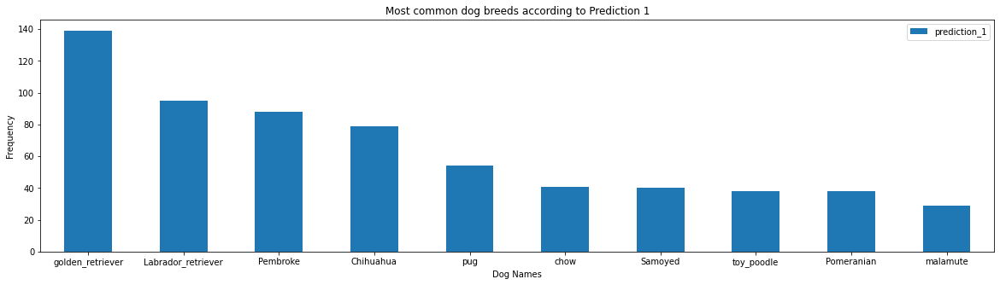

In [60]:
we_rate_dogs['prediction_1'].value_counts()[:10].plot(kind = 'bar', figsize = (20,5), rot = 0);
plt.xlabel('Dog Names');
plt.ylabel('Frequency');
plt.title('Most common dog breeds according to Prediction 1')
plt.legend();

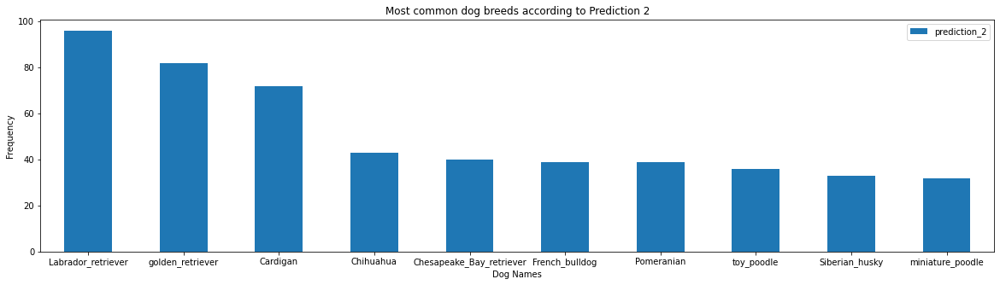

In [61]:
we_rate_dogs['prediction_2'].value_counts()[:10].plot(kind = 'bar', figsize = (20,5), rot = 0);
plt.xlabel('Dog Names');
plt.ylabel('Frequency');
plt.title('Most common dog breeds according to Prediction 2')
plt.legend();

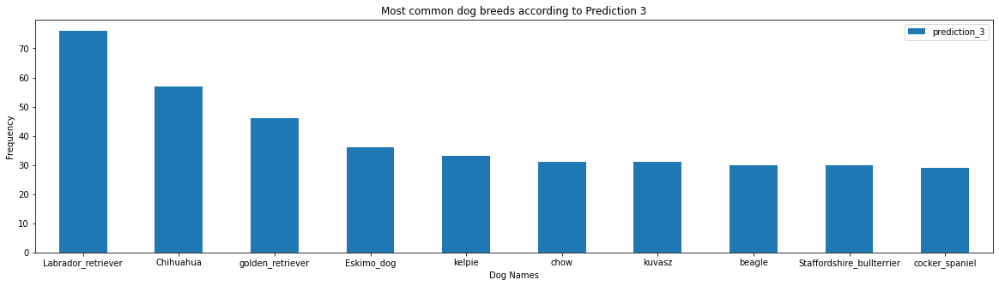

In [62]:
we_rate_dogs['prediction_3'].value_counts()[:10].plot(kind = 'bar', figsize = (20,5), rot = 0);
plt.xlabel('Dog Names');
plt.ylabel('Frequency');
plt.title('Most common dog breeds according to Prediction 3')
plt.legend();

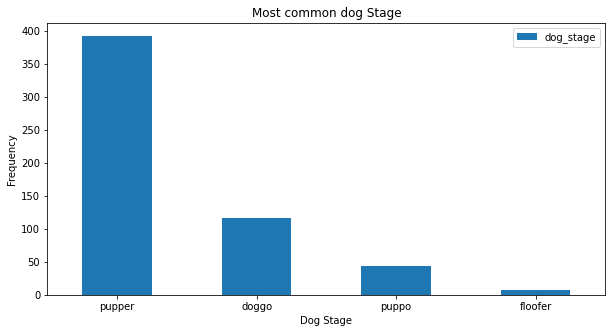

In [66]:
we_rate_dogs['dog_stage'].value_counts().plot(kind = 'bar', figsize = (10,5), rot = 0);
plt.xlabel('Dog Stage');
plt.ylabel('Frequency');
plt.title('Most common dog Stage')
plt.legend();

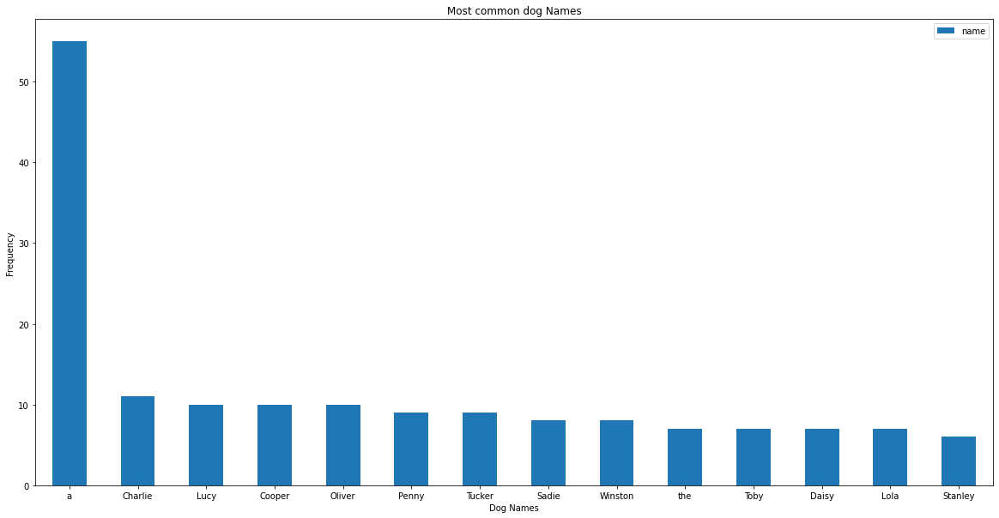

In [84]:
we_rate_dogs['name'].value_counts()[1:15].plot(kind = 'bar', figsize =(20,10), rot = 0);
plt.xlabel('Dog Names');
plt.ylabel('Frequency');
plt.title('Most common dog Names')
plt.legend();